# ¿Es realmente el chicharrón bueno para la salud? Modelos de ML y redes neuronales para detectar noticias falsas en el contexto colombiano. Pt 1. 

# Índice

- 1. Introducción y objetivos
   
- 2. Importación de librerías

- 3. Importación y descripción de los datasets. Metodología. 

- 4. Preprocesamiento y visualización en WordCloud 

- 5. Vectorización para poder implementar los modelos de ML

- 6. Modelos de clasificación
   - 6.1 Regresión logística
        - 6.1.1 Regresión logística para el dataset 2023
        - 6.1.2 Regresión logística para el dataset concatenado
   - 6.2 SVM
        - 6.2.1 SVM para el dataset 2023
        - 6.2.2 SVM para el dataset concatenado
   - 6.3 Naive Bayes
        - 6.3.1 Naive Bayes para el dataset 2023
        - 6.3.2 Naive Bayes para el dataset 2023
   - 6.4 Random Forest
        - 6.4.1 Random Forest para el dataset 2023
        - 6.4.2 Random Forest para el dataset concatenado
   - 6.5 XGBoost
        - 6.5.1 XGBoost para el dataset 2023
        - 6.5.2 XGBoost para el dataset concatenado

- 7. Comparación de modelos

- 8. Evaluación del mejor modelo con noticias nuevas
- 9. Conclusiones parciales

# 1. Introducción 

Durante el segundo semestre del 2023 una noticia inesperada fue compartida por algunos de los más importantes periódicos de Colombia. Ella anunciaba, que según estudios de la Escuela de Medicina de la Universidad de Boston, el chicharrón (los torrenznos en España) eran un alimento saludable para la salud. La noticia se hizo tan viral que incluso diarios y radios de España, México y otros países de habla hispana la dieron por buena. 

Todos ellos la dieron por buena asumiendo que el estudio citado era cierto. Sin embargo, no todos los medios la dieron por buena y algunos de ello hicieron algo tan simple como dirigirse al portal de la revista científica dónde supuestamente se había publicado el estudio y se dieron cuenta que no existía. El País de España, en un artículo del 14 de diciembre de 2023, citando al nutricionista Juan Camilo Mesa,  sostenía que: "Todo es una gran mentira, una noticia falsa replicada sin pensar por los medios para ganar clicks y audiencia." (Hernández Bonilla, 14 de diciembre de 2023). 

Mi formación como periodista y el hecho de estar realizando un bootcamp en Ciencia Datos inmediatamente me llevó a preguntarme por la posibilidad de generar algún modelo de Machine Learning que tuviera la capacidad de detectar noticias falsas en el contexto colombiano y ayudara a los periodistas a impedir que bulos como el ya citado se colaran en las redacciones. 

Al comenzar mi investigación me sorprendí porque evidentemente ya muchas otras personas habían pensado que los modelos aprendizaje supervisado tendrían la capacidad de detectar noticias falsas. Por ejemplo, Ansar y Goswami sostienen que: "With the advent of social media, the menace of fake news has become grievous due to the unrestrained propagation of information and difficulty to track several accounts operated by humans or bots. This menace can be mitigated through data science approaches by combining artificial intelligence with statistics and domain-based knowledge." (Ansar y Goswami, 2021, p. 1). 

No obstante, a pesar del auge de la utilización de modelos de machine learning para la detección de noticias falsas tuve un problema adicional: la mayoría de ellos se basaban en noticias falsas en inglés y los pocos que utilizaban datasets en español provenían de otros países de América Latina (Ver por ejemplo para Bolivia, Núñez (2022) y para Ecuador, Mafla et al., (2022).

Para el caso colombiano logré ubicar dos tesis. Por una parte Ortega y Quintero (2020) realizan un modelo de detección de noticias falsas utilizando Random Forest, Gradient Boosting y Deep Learning, pero lamentablemente utilizan que aunque no referencian correctamenta parece extraido del contexto mexicano 

Por otra parte, Flores y Montaño (2022) sí que utilizan un dataset de noticias falsas y ciertas extraídas del contexto colombiano (317 noticias falsas y 317 noticias verdaderas) al que luego concatenan los datasets recopilados por Posadas-Durán, et al. (2019) y Tretiakov, et al. (2022). Sobre los datasets aplican Random Forest, Naive Bayes, SVM, Regresión Logística, XGBoost y BERT. Los autores en sus resultados señalan que: "Debido al estilo de la sintaxis con la que se escriben las noticias en Colombia, se encontró que con el corpus creado en el proyecto se obtienen mejores resultados en la clasificación de noticias del contexto político colombiano en comparación con el corpus combinado que tiene noticias de diferentes países que hablan español." (Flores y Montaño, 2022, p. 51)

Sobre estas conclusiones decidí que sería un ejercicio interesante poder ampliar el dataset extraído por Flores y Montaño con un uno extraído por mi cuenta y volver a probar los modelos para saber si teniendo un conjunto más grande de noticias escritas en español colombiano las métricas de los modelos mejorarían. 

En este contexto el objetivo de este trabajo sera, entonces, comprobar si al tener un dataset más robusto de noticias falsa y verdaderas escritas en español colombiano los resultados de los modelos de clasificación de machine learning mejoran. 

Para ello implementaré regresión lineal, SVM, Naive Bayes, Random Forest y XGBoost tanto en el dataset que extraje por mi cuenta, como en el dataset ampliado con los datos de Flores y Montaño. 

Finalmente, compárar los resultados y comprobáre como funciona el mejor modelo detectando noticias falsas de un dataset con datos nuevos. 

# 2.  Importación de librerías  

In [216]:
#librerías generales
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns 

#preprocesamiento 
import re
import nltk
from nltk.corpus import stopwords
from stop_words import get_stop_words
import spacy
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
import string
from tqdm.notebook import tqdm as tqdm_notebook
from wordcloud import WordCloud
from unidecode import unidecode
from nltk.tokenize import word_tokenize
nltk.download('stopwords')
nltk.download('punkt')


#vectorizador - modelos ml - métricas. 
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report, precision_recall_fscore_support
from sklearn.pipeline import Pipeline
from scipy.stats import randint
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, roc_curve, auc
import scikitplot as skplt
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer


#configuración notebook
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_colwidth', None)

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/juanviatela/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/juanviatela/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


# 3. Importación y descripción de los datasets. Metodología. 


Como ya indiqué en la introducción este proyecto toma como base la investigación realizada por Flores y Montaño. En términos metodólogicos decidí seguir sus pautas a la hora de extraer mi dataset para poder concatenarlos sin problema. 

Los criterios a seguir fueron: 
- Las noticias falsas las extraje manualmente del sitio de verificación colombiano ColombiaCheck. Extraje únicamente las noticias que ellos califican como falsas sin importar su temática entre el 1 de enero de 2023 al 24 de enero de 2024. 
- Las noticias reales las extraje de manera manual y aleatoria del diario El Espectador en el mismo período que las anteriores. Extraje el mismo número de noticias para cuatro grandes temas: salud, judicial, política y paz y memoria. Esta la desición la tomé considerando -de manera no sistemática- cuáles habían sido los grandes temas a los que se referían las noticias falsas extraídas. 
- El dataset consta de las siguientes columnas
    - ID: index de la noticia
    - Categoría: Noticia real o noticia falsa
    - Tema: tema de la noticia
    - Origen: fuente de la noticia
    - Título: titular
    - Texto: texto de la noticia. En el caso de la noticia falsa solo utilizo el texto literal y no las interpretaciones o comentarios realizados por el verificador. En el caso de las noticias reales extraje el titular, el subtitulo y el primer párrafo. 
    - URL: link de la noticia. 
    
Mi dataset en total está compuesto por 814 noticias siendo 407 verdaderas y 407 falsas. El dataset de Flores y Montaño constaba de 643 noticias (317 ciertas y 317 falsas). El dataset concatenado resultó en un total de 1457 noticias 50% de ellas falsas y 50% verdaderas. 

Sobre estos criterios metodológicos en esta apartado del proyecto haré lo siguiente: 
- Importación de los datasets.
- Chequeo de dimensiones, nulos y contenido. 
- Selección de las columnas 'Categoría' y 'Texto' que serás las únicas a tener en cuenta para la ejecución de los modelos de machine learning. 
- Conteo y visualización de noticias falsas y verdaderas en cada dataset
- Conteo de la longitud de los carácteres de cada noticia
- Visualización y comparación de la distribución de la longitud de los carácteres de cada noticia en los dos datasets

In [217]:
#importamos de excel los datasets con noticias falsas y verdaderas de 2022 y 2023

df_fakenews_2022 = pd.read_excel('Corpus_Noticias_2022.xlsx', engine='openpyxl', converters={'Texto': str})
df_fakenews_2023 = pd.read_excel('Corpus_Noticias_2023.xlsx', engine='openpyxl', converters={'Texto': str})

In [218]:
#chequeamos dimensiones, nulos y primeras líneas de cada dataset
print(df_fakenews_2022.shape)
df_fakenews_2022.head(2)


(634, 7)


,ID,Categoria,Tema,Origen,Titulo,Texto,Fuente
0,1,Noticia Real,Politico,El tiempo,Duque dice que Eln se adjudicó atentado y busca incidir en elecciones,"El presidente Iván Duque condenó fuertemente el atentado terrorista que se presentó en la noche de este viernes, 7 de enero, contra miembros del Escuadrón Móvil Antidisturbios (Esmad) en la ciudad de Cali.",https://www.eltiempo.com/politica/gobierno/eln-se-adjudico-atentado-contra-el-esmad-en-cali-dice-duque-643750
1,2,Noticia Real,Politico,El espectador,"Gustavo Petro se reunirá con Pedro Sánchez, presidente de España","Gustavo Petro se reunirá con Pedro Sánchez, presidente de España Hasta ahora es el único precandidato que se reuniría con un primer mandatario. Lo hace en el marco de su campaña internacional.",https://www.elespectador.com/politica/?utm_source=interno&utm_medium=boton&utm_campaign=menu_hamburguesa&utm_content=boton_menu_hamburguesa


In [219]:
df_fakenews_2022.isnull().sum()

ID           0
Categoria    0
Tema         1
Origen       2
Titulo       0
Texto        0
Fuente       4
dtype: int64

In [220]:
#chequeamos dimensiones, nulos y primeras líneas de cada dataset
print(df_fakenews_2023.shape)
df_fakenews_2023.head(2)

(814, 7)


,ID,Categoria,Tema,Origen,Titulo,Texto,Fuente
0,1,Noticia Real,salud,el espectador,"Pese a las advertencias, en diciembre ya van 440 lesionados por pólvora","Pese a las advertencias, en diciembre ya van 440 lesionados por pólvora.\n\nLa situación empieza a ser muy preocupante, pues hay 50 casos más que en el mismo período del 2022. \n\nCada vez que llega diciembre, las advertencias se repiten: no hay que usar pólvora para celebrar las fiestas. Mucho menos hay que hacerlo mientras se ingiere alcohol y hay que evitar que los niños y niñas manipulen estos elementos. Pero las peticiones, al menos este año, no han tenido el efecto deseado. El último boletín del Instituto Nacional de Salud (INS) muestra números muy inquietantes: desde el 1 de diciembre ha habido 440 lesionados por pólvora pirotécnica, es decir, 50 más que en el mismo período de 2022",https://www.elespectador.com/salud/pese-a-las-advertencias-en-diciembre-de-2023-ya-van-440-lesionados-por-polvora/
1,2,Noticia Real,salud,el espectador,¿A qué se debe la crisis del Hospital General de Medellín? Esto responde su gerente,"¿A qué se debe la crisis del Hospital General de Medellín? Esto responde su gerente. \n\nDe acuerdo con el gerente, el hospital tiene una deuda de $260.000 millones, de los cuales casi $80.000 millones corresponden a EPS liquidadas. \n\nLa crisis financiera del Hospital General de Medellín (HGM) se sigue agudizando. De acuerdo con el gerente Mario Fernando Córdoba, el hospital requiere cerca de $26.000 millones al mes para su funcionamiento, pero los ingresos apenas ascienden a los $14.000 millones.",https://www.elespectador.com/salud/a-que-se-debe-la-crisis-del-hospital-general-de-medellin-esto-responde-su-gerente/


In [221]:
df_fakenews_2023.isnull().sum()

ID             0
Categoria      0
Tema           0
Origen         1
Titulo       407
Texto          0
Fuente         3
dtype: int64

Aunque en los dos dataset encontré nulos en las columnas Tema, origen, fuente y título para el nuestro análisis solo utilizaré las columnas texto y categoría, por lo cual no haré nada con los nulos. 

Añado que aunque puede parecer interesante realizar una descripción del tema al que pertenecen las noticias falsas y verdaderas de los dos años, como en la extracción no realicé un ejercicio exhaustivo de clasificación de las noticias en temas, la información no es relevante. 

Sin embargo, sí que realizaré una descripción del dataset pero sobre: 
- longitud del texto de noticias falsas y noticias verdaderas en los dos datasets 
- wordcloud de palabras en los dos datasets y en el dataset concatenado según noticias falsas y noticias verdaderas.

In [222]:
# seleccionaremos las columnas 'Categoria' y 'Texto' para los dos datasets. Estas son las columnas con las que 
#trabajaremos de aquí en adelante

df_fakenews_2022 = df_fakenews_2022[['Categoria', 'Texto']]
df_fakenews_2023 = df_fakenews_2023[['Categoria', 'Texto']]

In [223]:
df_fakenews_2022.head(2)

,Categoria,Texto
0,Noticia Real,"El presidente Iván Duque condenó fuertemente el atentado terrorista que se presentó en la noche de este viernes, 7 de enero, contra miembros del Escuadrón Móvil Antidisturbios (Esmad) en la ciudad de Cali."
1,Noticia Real,"Gustavo Petro se reunirá con Pedro Sánchez, presidente de España Hasta ahora es el único precandidato que se reuniría con un primer mandatario. Lo hace en el marco de su campaña internacional."


In [224]:
df_fakenews_2023.head(2)

,Categoria,Texto
0,Noticia Real,"Pese a las advertencias, en diciembre ya van 440 lesionados por pólvora.\n\nLa situación empieza a ser muy preocupante, pues hay 50 casos más que en el mismo período del 2022. \n\nCada vez que llega diciembre, las advertencias se repiten: no hay que usar pólvora para celebrar las fiestas. Mucho menos hay que hacerlo mientras se ingiere alcohol y hay que evitar que los niños y niñas manipulen estos elementos. Pero las peticiones, al menos este año, no han tenido el efecto deseado. El último boletín del Instituto Nacional de Salud (INS) muestra números muy inquietantes: desde el 1 de diciembre ha habido 440 lesionados por pólvora pirotécnica, es decir, 50 más que en el mismo período de 2022"
1,Noticia Real,"¿A qué se debe la crisis del Hospital General de Medellín? Esto responde su gerente. \n\nDe acuerdo con el gerente, el hospital tiene una deuda de $260.000 millones, de los cuales casi $80.000 millones corresponden a EPS liquidadas. \n\nLa crisis financiera del Hospital General de Medellín (HGM) se sigue agudizando. De acuerdo con el gerente Mario Fernando Córdoba, el hospital requiere cerca de $26.000 millones al mes para su funcionamiento, pero los ingresos apenas ascienden a los $14.000 millones."


In [225]:
#contamos cuántas noticias falsas y cuántas noticias verdaderas hay en cada dataset

conteo_2022 = df_fakenews_2022['Categoria'].value_counts()
conteo_2023 = df_fakenews_2023['Categoria'].value_counts()

print(conteo_2022)
print(conteo_2023)

Noticia Real     317
Noticia Falsa    317
Name: Categoria, dtype: int64
Noticia Real     407
Noticia Falsa    407
Name: Categoria, dtype: int64


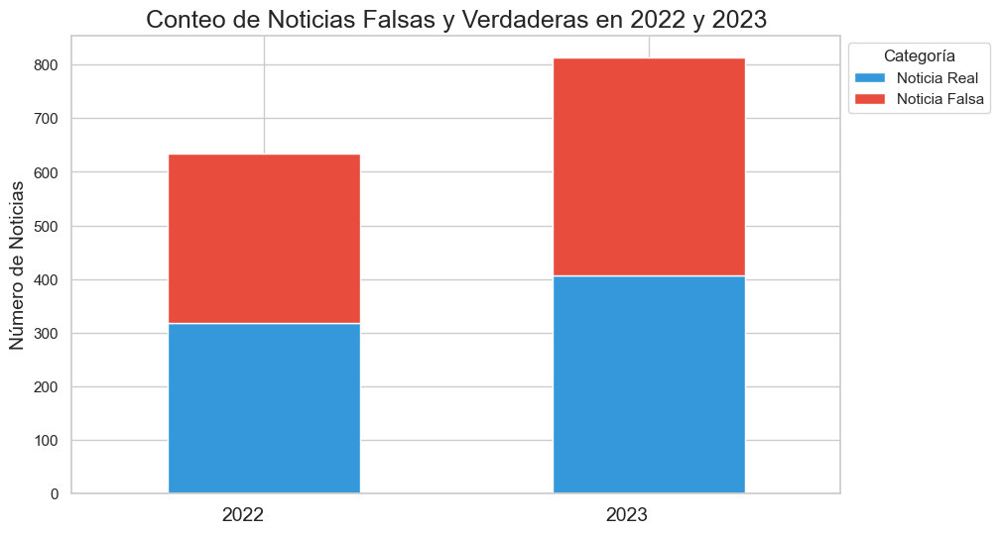

In [226]:
#visualizamos el conteo
df_visualizacion = pd.DataFrame({'2022': conteo_2022, '2023': conteo_2023})

df_visualizacion = df_visualizacion.transpose()

#dibujamos el gráfico de columnas
sns.set(style="whitegrid")
ax = df_visualizacion.plot(kind='bar', stacked=True, color=['#3498db', '#e74c3c'], figsize=(10, 6))

#configuramos títulos y leyendas
plt.title('Conteo de Noticias Falsas y Verdaderas en 2022 y 2023', fontsize=18)
plt.ylabel('Número de Noticias', fontsize=14)
plt.xticks(rotation=0, ha='right', fontsize=14)
plt.legend(title='Categoría', bbox_to_anchor=(1, 1), loc='upper left')
plt.show()


Podemos observar en la gráfica que tanto en el dataset de 2022 (el de Flores y Montaño) como en el mío (2023) se mantiene el balance entre noticias falsas y noticias verdadaderas. 

In [227]:
#Antes de continuar vamos a reemplazar los saltos de línea dobles del dataset de 2023. Esto lo hacemos por la 
#forma como fue ingresada la información en el documento xlsx. 

df_fakenews_2023['Texto'] = df_fakenews_2023['Texto'].replace(r'\n\n|\n|\r', ' ', regex=True)

In [228]:
#contamos los caracteres de los textos en los dos dataset y creamos una nueva columna 'longitudCaracteres'

def contarCaractes(texto):
  longitud=len(texto)
  return longitud

df_fakenews_2022["longitudCaracteres"]=df_fakenews_2022["Texto"].apply(contarCaractes)
df_fakenews_2023["longitudCaracteres"]=df_fakenews_2023["Texto"].apply(contarCaractes)

In [231]:
df_fakenews_2022.head(2)

,Categoria,Texto,longitudCaracteres
0,Noticia Real,"El presidente Iván Duque condenó fuertemente el atentado terrorista que se presentó en la noche de este viernes, 7 de enero, contra miembros del Escuadrón Móvil Antidisturbios (Esmad) en la ciudad de Cali.",205
1,Noticia Real,"Gustavo Petro se reunirá con Pedro Sánchez, presidente de España Hasta ahora es el único precandidato que se reuniría con un primer mandatario. Lo hace en el marco de su campaña internacional.",192


In [232]:
df_fakenews_2023.head(2)

,Categoria,Texto,longitudCaracteres
0,Noticia Real,"Pese a las advertencias, en diciembre ya van 440 lesionados por pólvora. La situación empieza a ser muy preocupante, pues hay 50 casos más que en el mismo período del 2022. Cada vez que llega diciembre, las advertencias se repiten: no hay que usar pólvora para celebrar las fiestas. Mucho menos hay que hacerlo mientras se ingiere alcohol y hay que evitar que los niños y niñas manipulen estos elementos. Pero las peticiones, al menos este año, no han tenido el efecto deseado. El último boletín del Instituto Nacional de Salud (INS) muestra números muy inquietantes: desde el 1 de diciembre ha habido 440 lesionados por pólvora pirotécnica, es decir, 50 más que en el mismo período de 2022",691
1,Noticia Real,"¿A qué se debe la crisis del Hospital General de Medellín? Esto responde su gerente. De acuerdo con el gerente, el hospital tiene una deuda de $260.000 millones, de los cuales casi $80.000 millones corresponden a EPS liquidadas. La crisis financiera del Hospital General de Medellín (HGM) se sigue agudizando. De acuerdo con el gerente Mario Fernando Córdoba, el hospital requiere cerca de $26.000 millones al mes para su funcionamiento, pero los ingresos apenas ascienden a los $14.000 millones.",500


Habiendo limpiado el dataset y establecido la longitud de cada texto medida en caracteres a continuación describiré cada conjuntos de datos haciendo: 
1. Descripción estadística la columna "longitudCaracteres' de los dos datasets según sean noticias falsas o verdaderas
2. Visualización de esta misma columna con histogramas
3. Visualización con boxplot. 
4. Conclusiones parciales

In [233]:
#agrupamos los datos según sean noticias falsas o verdaderas en cada año
real_2022 = df_fakenews_2022[df_fakenews_2022['Categoria'] == 'Noticia Real']
falsas_2022 = df_fakenews_2022[df_fakenews_2022['Categoria'] == 'Noticia Falsa']
real_2023 = df_fakenews_2023[df_fakenews_2023['Categoria'] == 'Noticia Real']
falsas_2023 = df_fakenews_2022[df_fakenews_2023['Categoria'] == 'Noticia Falsa']

In [236]:
real_2022.describe()

,longitudCaracteres
count,317.000000
mean,659.911672
std,373.150399
min,192.000000
25%,430.000000
50%,558.000000
75%,758.000000
max,2436.000000


In [237]:
falsas_2022.describe()

,longitudCaracteres
count,317.000000
mean,361.826498
std,347.894978
min,62.000000
25%,202.000000
50%,276.000000
75%,413.000000
max,3874.000000


Compruebo que en el dataset 2022: 
- La media de las noticias falsas es mucho más pequeña que la media de las noticias ciertas. 
- Su distribución estandar es bastante similar. 
- La distribución tanto de falsas como verdaderas tiene skew hacia la derecha. 
- La descripción estadística nos sugiere la presencia de outliers en la parte más alta de la distribución de las dos variables. Esto es, noticias mucho más largas que lo normal. 

In [238]:
real_2023.describe()

,longitudCaracteres
count,407.000000
mean,689.223587
std,156.809167
min,347.000000
25%,576.500000
50%,674.000000
75%,793.000000
max,1212.000000


In [239]:
falsas_2023.describe()

,longitudCaracteres
count,227.000000
mean,621.273128
std,516.349555
min,89.000000
25%,271.000000
50%,455.000000
75%,820.000000
max,3874.000000


Compruebo que en el dataset 2022: 
- La media de los dos conjuntos de noticias es bastante similar. 
- La distribución estandar del conjunto de noticias falsas es muchísimo mayor que la del conjunto de noticias verdaderas. 
- La distribución de las noticias reales parece normal, mientra que la de las noticias falsas se escora a la derecha. 
- La descripción estadística nos sugiere la presencia de outliers en la parte más alta de la distribución de las noticias falsas. 

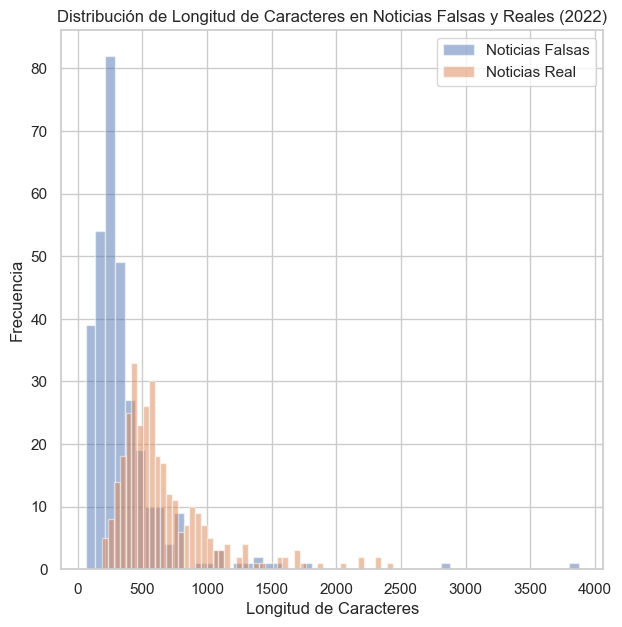

In [240]:
#creamos histograma para noticias falsas 2022
plt.hist(falsas_2022['longitudCaracteres'], bins=50, alpha=0.5, label='Noticias Falsas')

#creamos histograma para noticias verdaderas 2022
plt.hist(real_2022['longitudCaracteres'], bins=50, alpha=0.5, label='Noticias Real')

#configuramos el gráfico
plt.title('Distribución de Longitud de Caracteres en Noticias Falsas y Reales (2022)')
plt.xlabel('Longitud de Caracteres')
plt.ylabel('Frecuencia')
plt.legend(loc='upper right')
plt.show()

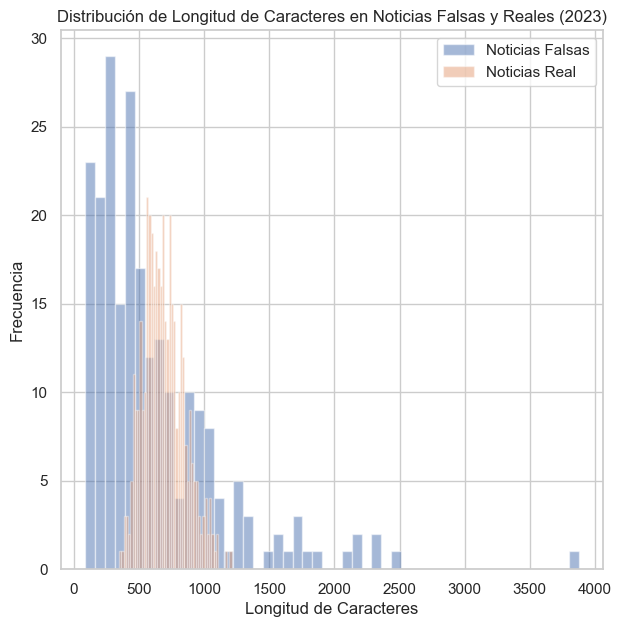

In [241]:
#creamos histograma para noticias falsas 2023
plt.hist(falsas_2023['longitudCaracteres'], bins=50, alpha=0.5, label='Noticias Falsas')

#creamos histograma para noticias verdaderas 2022
plt.hist(real_2023['longitudCaracteres'], bins=50, alpha=0.4, label='Noticias Real')

#configuramos el gráfico
plt.title('Distribución de Longitud de Caracteres en Noticias Falsas y Reales (2023)')
plt.xlabel('Longitud de Caracteres')
plt.ylabel('Frecuencia')
plt.legend(loc='upper right')
plt.show()

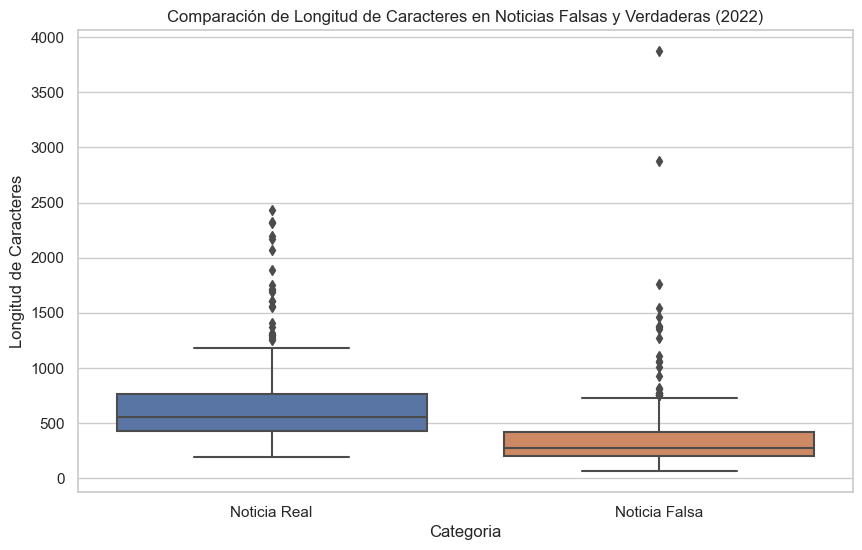

In [242]:
#determinamos el estilo del gráfico 
sns.set(style="whitegrid")

#creamos un gráfico de cajas para comparar la distribución de longitud de caracteres de las noticias de 2022
plt.figure(figsize=(10, 6))
sns.boxplot(x='Categoria', y='longitudCaracteres', data=df_fakenews_2022)

#configuramos el gráfico
plt.title('Comparación de Longitud de Caracteres en Noticias Falsas y Verdaderas (2022)')
plt.ylabel('Longitud de Caracteres')
plt.show()

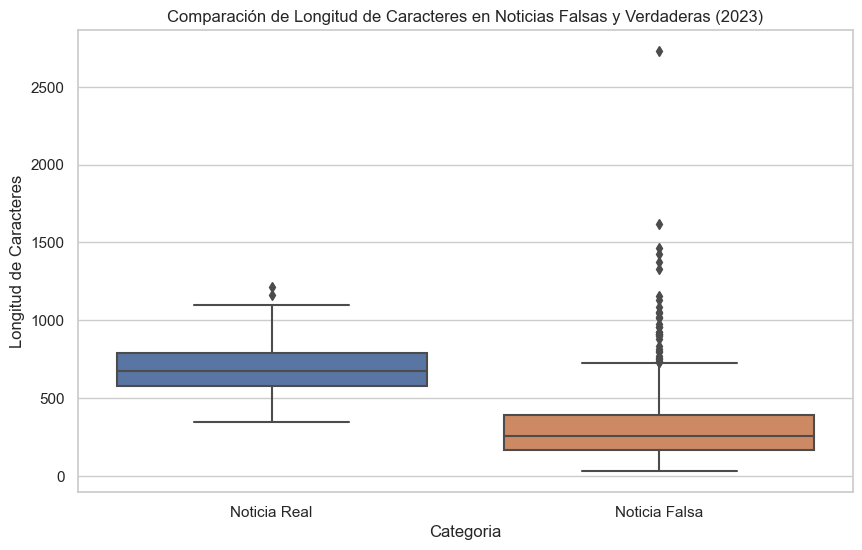

In [243]:
#determinamos el estilo del gráfico 
sns.set(style="whitegrid")

#creamos un gráfico de cajas para comparar la distribución de longitud de caracteres de las noticias de 2022
plt.figure(figsize=(10, 6))
sns.boxplot(x='Categoria', y='longitudCaracteres', data=df_fakenews_2023)

#configuramos el gráfico
plt.title('Comparación de Longitud de Caracteres en Noticias Falsas y Verdaderas (2023)')
plt.ylabel('Longitud de Caracteres')
plt.show()

Sobre las visualizaciones además de lo dicho anteriormente podemos añadir: 
- En los dos casos las medianas de las noticias falsas y las noticias verdaderas es diferente. Es importante subrayar que las noticias falsas son mucho más cortas que las reales.  
- Comprobé la existencia de outliers en los conjuntos de noticias de 2022 y su escasez en el conjunto de noticias verdaderas de 2023. Esto tiene que ver el tipo extracción controlada que realizé. Esto es: mientras que no existió criterio de extracción para la longitud del texto de las noticias falsas (extrajé los fragmentos disponibles en la página de verificación) en el caso de las noticias verdaderas sí que utilicé el criterio de titular, subtitular y primer párrafo. En el ámbito periodístico por regla estás secciones siempre tienen una longitud estandar. 

# 4. Preprocesamiento y visualización en WordCloud 

En este apartado primero realizaré la importación de las stopwords en español y añadiré un conjunto de stopwords adicionales. 

A continuación implementaré los siguientes procedimientos en cada uno de los datasets: 
- remover saltos de linea
- remover urls   
- remover espacios en blanco        
- convertir todo el texto en minúsculas    
- remover signos de puntuación     
- remover números
- remover stopwords
- lemantizamos en español
- removemos tildes
    
Aquí tengo que comentar que en el proyecto de Flores y Montaño la lemantización se realizó en inglés por lo que los resultados de aquí en adelante son bastante discutibles. Yo realizé la lemantización y por eso la eliminación de tildes la dejé para el final. De haberla hecho antes, la lemantización habría vuelto a añadir tíldes a las palabras. 

Finalmente, filtraré el dataset 2022, el dataset 2023 y el dataset concatenado con los criterios de noticias falsas y noticias verdaderas para poder realizar el wordcloud de cada conjunto de datos. 

In [244]:
#cargamos el dataset que complementa las stopwords en español
df_stopwords=pd.read_csv("spanish.txt")

#importamos la lista de stopwords en español de stoplist y nltk_word
stoplist = list(get_stop_words('spanish'))  
nltk_words = list(stopwords.words('spanish')) 

#agregamos las listas incluyendo el dataset del archivo "spanish.txt"
stoplist.extend(nltk_words)
stoplist.extend(df_stopwords['stopwords'].tolist())

#eliminamos las tildes para la limpieza
list_stop_words = []
for n in stoplist:
    list_stop_words.append(unidecode(n))
stoplist=list_stop_words

print('La lista de stopwords en español contiene', len(stoplist), 'palabras')

La lista de stopwords en español contiene 1229 palabras


In [245]:
#crearemos funciones para cada uno de los procedimientos de limpieza y preprocesamiento del texto 

#remover saltos de línea
def remove_newlines_tabs(text):
    formatted_text = text.replace('\n', ' ').replace('\n', ' ').replace('\t',' ').replace('\\', ' ')
    return formatted_text                                                                                

In [246]:
#remover espacios en blanco
def remove_whitespace(text):
    pattern = re.compile(r'\s+') 
    without_whitespace = re.sub(pattern, ' ', text)
    text = without_whitespace.replace(')', ') ')
    text=text.replace("  ", " ").replace("   ", " ").replace("    ", " ").lstrip()
    text=text.replace("  ", " ").replace("   ", " ").replace("    ", " ").rstrip()
    text=text.replace("   ", "")
    return text 

In [247]:
#remover tildes
def remove_accented_characters(text):
    text = unidecode(text)
    return text

In [248]:
#remover caracteres especiales
def remove_special_characters(text):
    return text.translate(str.maketrans('','',string.punctuation))
     

In [249]:
#poner todo el texto en minúsculas
def lower_text(text):
    text = text.lower()
    return text

In [250]:
#remover urls
def remove_links(text): 
    text=re.sub(r"https?:\/\/t.co\/[A-Za-z0-9]+",'',text)
    text=re.sub(r'https?://\S+|www\.\S+','',text)
    text=re.sub(r'opr-littps://S+','',text)
    return text

In [251]:
#remover números
def remove_numbers(text):
    text = re.sub(r'\d+', '', text)
    return text

In [252]:
#remover stopwords
def remove_stopwords(text):
    nostopwords = [word for word in word_tokenize(text) if word.lower() not in stoplist]
    words_string = ' '.join(nostopwords)   
    return words_string

In [253]:
#lemantizar en español 
nlp = spacy.load('es_core_news_sm')
def lemmatizer(text):  
  doc = nlp(text)
  return ' '.join([word.lemma_ for word in doc])

In [254]:
#creamos una función que realize todo el preprocesamiento

def text_preprocessing(text, newlines_tabs=True, 
                             links=True,
                             extra_whitespace=True,
                             lowercase=True,
                             characters_specials=True,
                             numbers_remove=True,
                             accented_chars=True, 
                             stop_words=True,
                             lemmatization = True):
                                  
#removemos saltos de linea
    if newlines_tabs == True:  
        data = remove_newlines_tabs(text) 
#removemos urls   
    if links == True: 
        data = remove_links(data)
#removemos espacios en blanco        
    if extra_whitespace == True: 
        data = remove_whitespace(data)
#convertimos todo el texto en minúsculas    
    if lowercase == True: 
        data = lower_text(data)
#removemos signos de puntuación     
    if characters_specials == True: 
        data = remove_special_characters(data)
#removemos números
    if numbers_remove == True: 
        data = remove_numbers(data)
#removemos stopwords
    if stop_words == True: 
        data = remove_stopwords(data) 
#lemantizamos
    if lemmatization == True: 
        data = lemmatizer(data) 
#removemos tildes
    if accented_chars == True: 
        data = remove_accented_characters(data) 
        
    return data

In [255]:
#preprocesamos con la función en el dataframe de 2022 y creamos una nueva columna con el texto preprocesado
List_News = df_fakenews_2022['Texto'].to_list()
Final_News = []
Complete_Content = []
for news in List_News:
    Processed_Content = text_preprocessing(news)
    Final_News.append(Processed_Content)

Complete_Content.extend(Final_News)
df_fakenews_2022['Processed_Text'] = Complete_Content

In [256]:
real_2022_preprocess = df_fakenews_2022[df_fakenews_2022['Categoria']== 'Noticia Real']
fake_2022_preprocess = df_fakenews_2022[df_fakenews_2022['Categoria']== 'Noticia Falsa']

In [257]:
real_2022_preprocess.head(2)

,Categoria,Texto,longitudCaracteres,Processed_Text
0,Noticia Real,"El presidente Iván Duque condenó fuertemente el atentado terrorista que se presentó en la noche de este viernes, 7 de enero, contra miembros del Escuadrón Móvil Antidisturbios (Esmad) en la ciudad de Cali.",205,presidente ivan duque condenar fuertemente atentado terrorista presentar noche viernes enero miembro escuadron movil antidisturbios esmad ciudad cali
1,Noticia Real,"Gustavo Petro se reunirá con Pedro Sánchez, presidente de España Hasta ahora es el único precandidato que se reuniría con un primer mandatario. Lo hace en el marco de su campaña internacional.",192,gustavo petro reunir pedro sanchez presidente espana unico precandidato reuniriar mandatario marco campana internacional


In [258]:
fake_2022_preprocess.head(2)

,Categoria,Texto,longitudCaracteres,Processed_Text
32,Noticia Falsa,"#ÚLTIMA_HORA Le ordenaré a los empresarios de Colombia para el descuento de nómina de $ 12.559 pesos a cada trabajador para ayudar a los emigrantes venezolanos para poner la vacuna del covid a ellos, es una ley que mandaré al Senado para su aprobación, este descuento será en tres quincena de cada trabajador. Esto también será para las fuerzas armadas y públicas el descuento (sic)",383,ultimahoro ordenar empresario colombia descuento nomin pesos trabajador ayudar emigrante venezolano vacuna covid ley mandar senado aprobacion descuento ser quincena trabajador tambien ser fuerza armado publico descuento sic
41,Noticia Falsa,"La plandemia solo fue creada para causar miedo y sometimiento ante un régimen nwo . ellos quieren el mismo régimen de china ,el cambio climático junto con otros es falso solo es cortinas de humo para ocultar lo que realmente esta pasando",238,plandemia creado causar miedo sometimiento regimen nwo querer regimen chino cambio climatico falso cortina humo ocultar realmente pasar


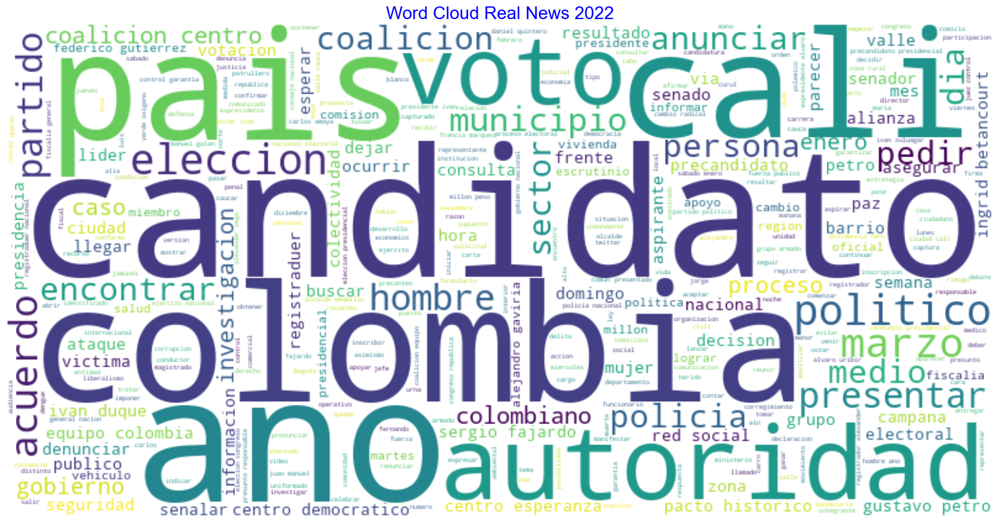

In [259]:
wc = WordCloud(background_color="white", max_words=3000, width=800, height=400,stopwords=stoplist)
wc.generate(' '.join(real_2022_preprocess['Processed_Text']))
plt.figure(figsize=(20, 15))
plt.title("Word Cloud Real News 2022", fontsize=20,color='blue')
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

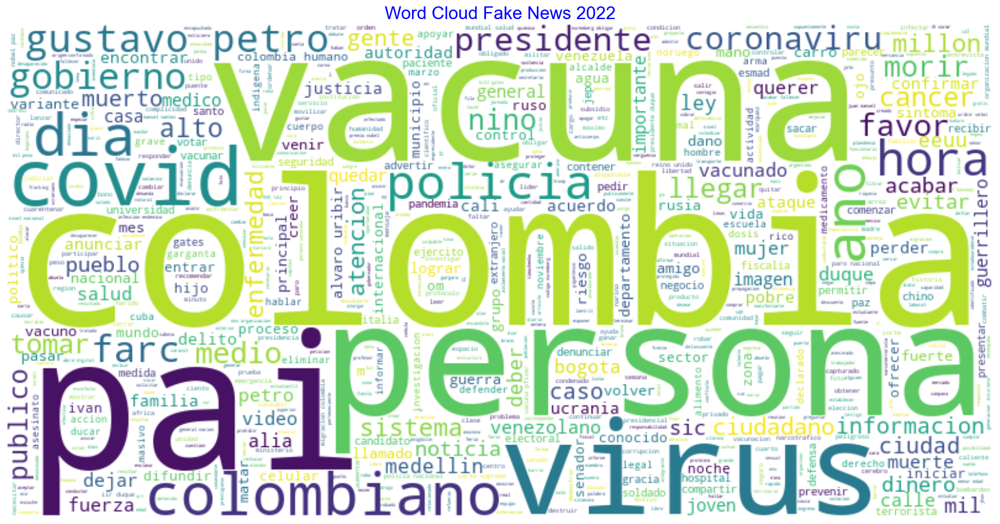

In [260]:
wc = WordCloud(background_color="white", max_words=3000, width=800, height=400,stopwords=stoplist)
wc.generate(' '.join(fake_2022_preprocess['Processed_Text']))
plt.figure(figsize=(20, 15))
plt.title("Word Cloud Fake News 2022", fontsize=20,color='blue')
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

In [261]:
#preprocesamos con la función en el dataframe de 2023 y creamos una nueva columna con el texto preprocesado
List_News = df_fakenews_2023['Texto'].to_list()
Final_News = []
Complete_Content = []
for news in List_News:
    Processed_Content = text_preprocessing(news)
    Final_News.append(Processed_Content)

Complete_Content.extend(Final_News)
df_fakenews_2023['Processed_Text'] = Complete_Content

In [262]:
real_2023_preprocess = df_fakenews_2023[df_fakenews_2023['Categoria']== 'Noticia Real']
fake_2023_preprocess = df_fakenews_2023[df_fakenews_2023['Categoria']== 'Noticia Falsa']

In [263]:
real_2023_preprocess.head(2)

,Categoria,Texto,longitudCaracteres,Processed_Text
0,Noticia Real,"Pese a las advertencias, en diciembre ya van 440 lesionados por pólvora. La situación empieza a ser muy preocupante, pues hay 50 casos más que en el mismo período del 2022. Cada vez que llega diciembre, las advertencias se repiten: no hay que usar pólvora para celebrar las fiestas. Mucho menos hay que hacerlo mientras se ingiere alcohol y hay que evitar que los niños y niñas manipulen estos elementos. Pero las peticiones, al menos este año, no han tenido el efecto deseado. El último boletín del Instituto Nacional de Salud (INS) muestra números muy inquietantes: desde el 1 de diciembre ha habido 440 lesionados por pólvora pirotécnica, es decir, 50 más que en el mismo período de 2022",691,pese advertencia diciembre lesionado polvoro situacion empezar preocupante caso mas periodo llegar diciembre advertencia repetir polvora celebrar fiesta ingerir alcohol evitar nino ninas manipular elemento peticion ano efecto deseado ultimo boletin instituto nacional salud ins mostrar numero inquietante diciembre lesionado polvora pirotecnico mas periodo
1,Noticia Real,"¿A qué se debe la crisis del Hospital General de Medellín? Esto responde su gerente. De acuerdo con el gerente, el hospital tiene una deuda de $260.000 millones, de los cuales casi $80.000 millones corresponden a EPS liquidadas. La crisis financiera del Hospital General de Medellín (HGM) se sigue agudizando. De acuerdo con el gerente Mario Fernando Córdoba, el hospital requiere cerca de $26.000 millones al mes para su funcionamiento, pero los ingresos apenas ascienden a los $14.000 millones.",500,? a que crisis hospital general medellin responder gerente acuerdo gerente hospital deuda millones millon corresponder eps liquidada crisis financiero hospital general medellin hgm agudizar acuerdo gerente mario fernando cordoba hospital requerir millon mes funcionamiento ingreso ascender millon


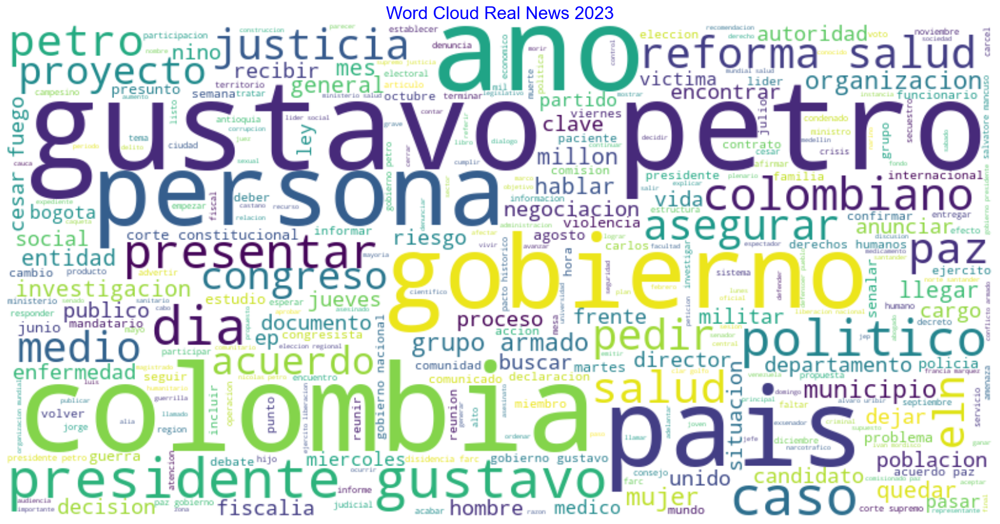

In [264]:
wc = WordCloud(background_color="white", max_words=3000, width=800, height=400,stopwords=stoplist)
wc.generate(' '.join(real_2023_preprocess['Processed_Text']))
plt.figure(figsize=(20, 15))
plt.title("Word Cloud Real News 2023", fontsize=20,color='blue')
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

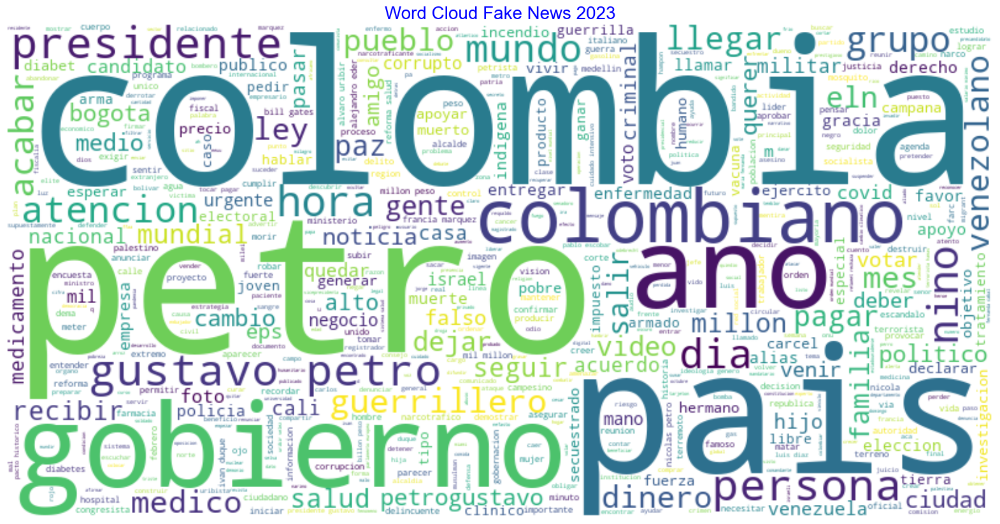

In [265]:
wc = WordCloud(background_color="white", max_words=3000, width=800, height=400,stopwords=stoplist)
wc.generate(' '.join(fake_2023_preprocess['Processed_Text']))
plt.figure(figsize=(20, 15))
plt.title("Word Cloud Fake News 2023", fontsize=20,color='blue')
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

In [266]:
df_news_concat = pd.concat([df_fakenews_2022, df_fakenews_2023], ignore_index=True)

real_concat = df_news_concat[df_news_concat['Categoria']== 'Noticia Real']
fake_concat = df_news_concat[df_news_concat['Categoria']== 'Noticia Falsa']

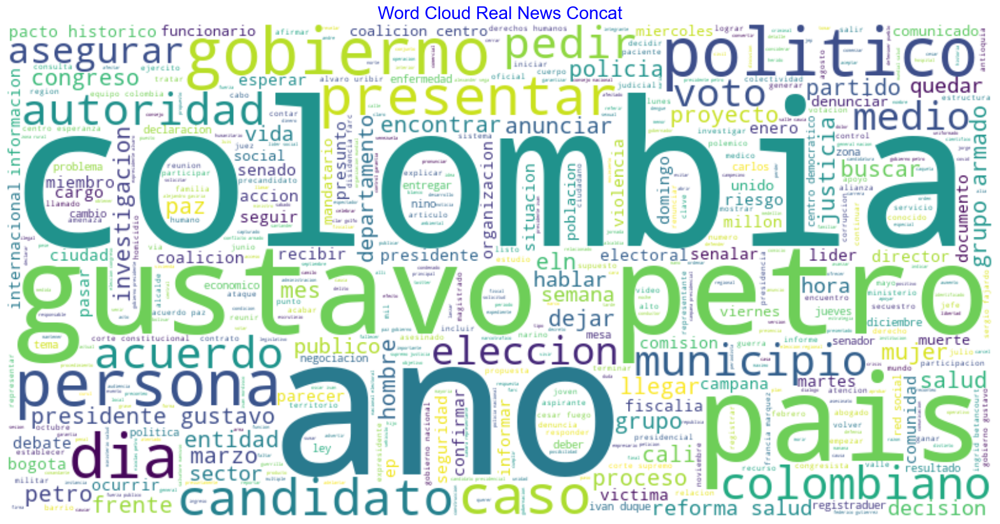

In [267]:
#conteo verdaderas concat
wc = WordCloud(background_color="white", max_words=3000, width=800, height=400,stopwords=stoplist)
wc.generate(' '.join(real_concat['Processed_Text']))
plt.figure(figsize=(20, 15))
plt.title("Word Cloud Real News Concat", fontsize=20,color='blue')
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

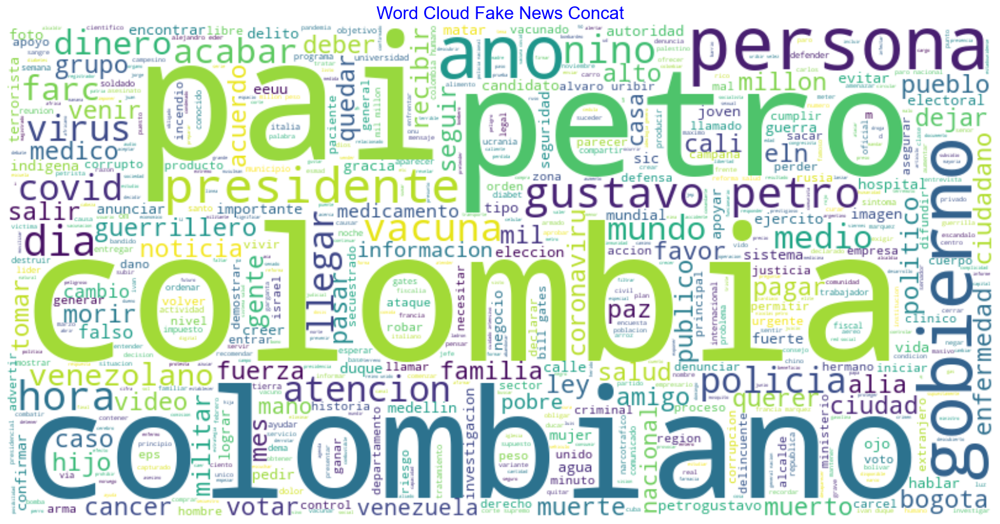

In [268]:
#conteo falsas concat
wc = WordCloud(background_color="white", max_words=3000, width=800, height=400,stopwords=stoplist)
wc.generate(' '.join(fake_concat['Processed_Text']))
plt.figure(figsize=(20, 15))
plt.title("Word Cloud Fake News Concat", fontsize=20,color='blue')
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

Conclusiones sobre los wordclouds: 
   - En el dataset de noticias reales de 2022 la nube de palabras nos indica como las más importantes: país, candidato y Colombia. Habiendo sido este año uno electoral tiene todo el sentido que estas sean las palabras relevantes. 
   - Sin embargo, en el dataset de noticias falsas de 2022 se que las palabras tiene que ver con vacuna, Colombia, virus. Parece, entonces, que las noticias falsas giran aún alrededor de la vacunación contra la Covid-19. Adicional, es importante tener en cuenta que las nubes de palabras del dataset de noticias ciertas y noticias falsas de 2022 es bastante diferente. 
   - En el caso de los datasets de 2023 la situación es diferente. En el caso de las noticias falsas y de las noticias ciertas las palabras relevantes son bastante similares: Petro (el apellido del Presidente), gobierno y Colombia. Es posible suponer que en este caso existe una convergencia entre los temas sobre los que se han publicado noticias falsas y noticias reales. 
   - Finalmente, sobre el dataset concatenado es posible decir lo mismo que sobre el anterior. Tanto fake news como noticias reales giran alrededor de las acciones del Presidente Gustavo Petro. 

# 5. Vectorización para poder implementar los modelos de ML

La vectorización es una transformación necesaria para poder implementar modelos de machine learning sobre conjuntos de datos textuales. 

En este proyecto escogí, por ser el más utilizado, el método Tfidf para realizar la vectorización. Según Mafla, et al., "The term frequency (TF) measures the frequency withwhich a term appears in a given document, while the inverse doc-ument frequency (IDF) measures the importance of a term withinthe corpus, weighing less weight to the terms that are very com-mon within the corpus, while it weighs more unusual." (2022, p. 9). 

Además, con sus hiperparámetros podemos establecer: 
- Si cuantifica la frecuencia en unigramas, bigramas o trigramas. Es decir, descopone las frases en conjuntos de una, dos o tres palabras. 
- Si ignora términos demasiado frecuentes
- Si ignora términos muy poco frecuentes
- Crear un vocabulario que tenga un número máximo de features ordenadas por frecuencia en todo el dataframe
- Criterios de regularización (l1 y l2)

Sobre el conjunto de datos vectorizado determinaré los conjuntos de train y test del dataset 2023 y del dataset concatenado para poder implementar los modelos de ml. 

In [270]:
SEED = 42

#codificamos los labels
category_codes = {
     'Noticia Real': 0,
     'Noticia Falsa': 1
}

#asignamos los labels a cada row del dataset concat
df_news_concat['label'] = df_news_concat['Categoria']
df_news_concat = df_news_concat.replace({'label':category_codes})

df_news_concat

,Categoria,Texto,longitudCaracteres,Processed_Text,label
0,Noticia Real,"El presidente Iván Duque condenó fuertemente el atentado terrorista que se presentó en la noche de este viernes, 7 de enero, contra miembros del Escuadrón Móvil Antidisturbios (Esmad) en la ciudad de Cali.",205,presidente ivan duque condenar fuertemente atentado terrorista presentar noche viernes enero miembro escuadron movil antidisturbios esmad ciudad cali,0
1,Noticia Real,"Gustavo Petro se reunirá con Pedro Sánchez, presidente de España Hasta ahora es el único precandidato que se reuniría con un primer mandatario. Lo hace en el marco de su campaña internacional.",192,gustavo petro reunir pedro sanchez presidente espana unico precandidato reuniriar mandatario marco campana internacional,0
2,Noticia Real,"Marta Lucía Ramírez se queja por servicio en el 'call center' de Avianca Aerolínea dice que cuando un cliente les escribe en redes sociales lo contactan para dar solución. Es una falta de respeto al cliente"", así se refirió la vicepresidenta y canciller Marta Lucía Ramírez en las últimas horas sobre el 'call center' de Avianca.",330,martar lucir ramirez quejo servicio call center avianco aerolineo cliente escribir red social contactar solucion faltar respetar cliente asi referir vicepresidenta canciller marta lucir ramirez ultimo hora call center avianco,0
3,Noticia Real,"Elecciones de 2022 requieren mayor cuidado, porque hay menos información: MOE Alejandra Barrios, directora de la Misión de Observación Electoral (MOE), prende las alarmas por las dificultades para acceder a información relacionada con los comicios de cara a hacer seguimiento y control. En entrevista, da cuenta de los riesgos que ya se perciben con miras a los comicios.",371,eleccion requerir cuidado informacion moe alejandrir barrio director mision observacion electoral moe prender alarma dificultad acceder informacion relacionado comicio car seguimientir control entrevista riesgo percibir mira comicio,0
4,Noticia Real,"ANTE LA expansión de la variante ómicron en el territorio nacional, lo que ha desatado un aumento en el número de casos activos por coronavirus en el país, la Procuraduría General de la Nación citó a 52 alcaldes y gobernadores para que expliquen los motivos por los cuales autorizaron la realización de feriados y celebraciones patronales en varios municipios.",360,expansion variante omicron territorio nacional desatado aumento numero caso activo coronavirus pais procuraduriar general nacion citar alcalde gobernador explicar motivo autorizar realizacion feriado celebracion patronal municipio,0
...,...,...,...,...,...
1443,Noticia Falsa,"Esta imagen me dejó marcado, yo la recuerdo y siento ira, M19 LA VIOLARON, LA EMBARAZARON DIZQUE PARA HACERLE UN HIJO DEL PUEBLO,Y LUEGO LA ASESINARON. Gloria Lara secuestrada, violada, torturada y, finalmente, asesinada vilmente por el M-19 de Gustavo Petro y Antonio Navarro. Fue hallada muerta en estado de embarazo causado por sus captores del M-19",353,imagen dejar marcado recuerdo siento ira m violar embarazar dizque hacer el hijo puebloy asesinar gloria laro secuestrado violado torturado finalmente asesinado vilmente m gustavo petro antonio navarro hallado muerto embarazo causado captor m,1
1444,Noticia Falsa,"En Alemania el gobierno subió el precio del combustible y en sólo una hora de tiempo la gente abandonó sus coches en las calles y avenidas y se fueron caminando a casa. Más de un millón de coches abandonados. Tuvieron qué bajar el precio del combustible. Cuando el pueblo es inteligente, los corruptos no logran concretar sus metas",331,alemania gobierno subir precio combustible solo horo gente abandonar coche call avenida caminar casa mas millon coche abandonado que bajar precio combustible pueblo inteligente corrupto lograr concretar meta,1
1445,Noticia Falsa,Gustavo Petro es un demonio que le ha dado el alma al diablo. hoy el Petro y sus secuases comandan un narcoestado que atenta en contra de la seguridad del pueblo estadouni

In [50]:
#creamos una función para la vectorización

def tifdf_features (X_train, X_test, y_train, y_test, 
                    ngram_range, max_df, min_df, max_features, norm, sublinear_tf):
    tfidf = TfidfVectorizer(encoding='utf-8',
                        ngram_range=ngram_range,
                        stop_words=None,
                        lowercase=False,
                        max_df=max_df,
                        min_df=min_df,
                        max_features=max_features,
                        norm=norm,
                        sublinear_tf=sublinear_tf)
    features_train = tfidf.fit_transform(X_train)
    features_test = tfidf.transform(X_test)
    labels_train = y_train
    labels_test = y_test
    return features_train,features_test,labels_train,labels_test,tfidf

In [51]:
X=df_news_concat['Processed_Text']
y=df_news_concat['label']

In [875]:
param_grid = {
    'tfidf__max_df': [0.7, 0.8, 0.9],
    'tfidf__min_df': [0.001, 0.01, 0.1],
    'tfidf__max_features': [1000, 2000, 3000, 4000],
    'tfidf__norm': ['l1', 'l2'],
    'tfidf__sublinear_tf': [True, False],
    'tfidf__ngram_range': [(1, 1), (1, 2), (1, 3)]  
         }

#instanciamos el vectorizador y el modelo sobre le que vamos a probar los resultados
tfidf_vectorizer = TfidfVectorizer()
logreg = LogisticRegression(random_state=SEED)

#creamos un pipeline con el vectorizador y el modelo
pipeline = Pipeline([
    ('tfidf', tfidf_vectorizer),
    ('classifier', logreg)  
])
    
#creamos el objeto grid_search
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='accuracy', n_jobs=1)

#entrenamos el modelo sobre el conjunto completo de datos
grid_search.fit(X, y)

#imprimimos los mejores parámetros 
best_params = grid_search.best_params_
print("Mejores hiperparámetros:", best_params)

Mejores hiperparámetros: {'tfidf__max_df': 0.7, 'tfidf__max_features': 4000, 'tfidf__min_df': 0.001, 'tfidf__ngram_range': (1, 3), 'tfidf__norm': 'l2', 'tfidf__sublinear_tf': True}


In [52]:
#definimos los mejores parámetros
ngram_range = (1, 3) 
min_df = 0.001 
max_df = 0.7 
max_features = 4000
norm = 'l2'
sublinear_tf = True

In [53]:
#generamos los conjuntos vectorizados de entrenamiento y prueba del dataset 2023

X_train_2023, X_test_2023, y_train_2023, y_test_2023 = train_test_split(df_fakenews_2023['Processed_Text'], 
                                                                        df_fakenews_2023['label'], 
                                                                        test_size=0.20, 
                                                                        random_state=SEED)

features_train_2023,features_test_2023,labels_train_2023,labels_test_2023,tfidf=tifdf_features(X_train_2023, 
                                                                                               X_test_2023, 
                                                                                               y_train_2023, 
                                                                                               y_test_2023,
                                                                                               ngram_range, 
                                                                                               max_df, 
                                                                                               min_df, 
                                                                                               max_features,
                                                                                               norm,
                                                                                               sublinear_tf)

In [54]:
#generamos los conjuntos vectorizados de entrenamiento y prueba del dataset concat
X_train_concat, X_test_concat, y_train_concat, y_test_concat = train_test_split(df_news_concat['Processed_Text'], 
                                                                                df_news_concat['label'], 
                                                                                test_size=0.20, 
                                                                                random_state=SEED)

features_train_concat,features_test_concat,labels_train_concat,labels_test_concat,tfidf_concat=tifdf_features(X_train_concat, 
                                                                                               X_test_concat, 
                                                                                               y_train_concat, 
                                                                                               y_test_concat,
                                                                                               ngram_range, 
                                                                                               max_df, 
                                                                                               min_df, 
                                                                                               max_features,
                                                                                               norm,
                                                                                               sublinear_tf)

# 6. Modelos de clasificación

Según Mafla, et al (2022) los métodos clásicos de clasificación han funcionado muy bien para resolver el problema de detección de noticias falsas en inglés. Los autores mencionan la utilización de SVM, random forest y XGBoost como aquellos que han dado mejores resultados. Tomando por cierto este argumento, en este proyecto decidí utilizar los siguientes modelos de clásificación: regresión logística, svm, naives bayes, random forest y xgboost. 

En cada uno de los modelos determiné sus mejores parámetros -utilizando GridSearch para los más simples y RandomSearch para los más complejos- para ser implementados tanto en el dataset de 2023 como en el dataset concatenado con los datos de Flores y Montaño. 

## 6.1. Regresión logística

### 6.1.1 Regresión logística para el dataset 2023

In [879]:
#específicamos los parámetros que queremos buscar
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga']
}

#instanciamos el modelo
logreg = LogisticRegression(max_iter=2000)  

#creamos el objeto GridSeachCV y establecemos el valor del crossvalidationf
grid_search = GridSearchCV(logreg, param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=1)

#ajustamos el método a los datos del df de 2023
grid_search.fit(features_train_2023, labels_train_2023)

#imprimimos los mejores parámetros 
print("Mejores parámetros encontrados:")
print(grid_search.best_params_)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Mejores parámetros encontrados:
{'C': 10, 'penalty': 'l2', 'solver': 'liblinear'}


In [55]:
#instanciamos el modelo con los mejores parámetros
best_logreg_model = LogisticRegression(C=10, 
                                       penalty='l2', 
                                       solver='liblinear',  
                                       random_state = SEED)

#ajustamos el modelo al dataset 2023
best_logreg_model.fit(features_train_2023, labels_train_2023)

#predecimos y a partir de X
y_pred = best_logreg_model.predict(features_test_2023)

#evaluamos el modelo
accuracy_logreg_2023 = accuracy_score(labels_test_2023, y_pred)
report = classification_report(labels_test_2023, y_pred)

#imprimimos los resultados de la evaluación
print("Exactitud (Accuracy):", accuracy_logreg_2023)
print("\nInforme de clasificación:\n", report)

precision, recall, f1_logreg_2023, _ = precision_recall_fscore_support(labels_test_2023, y_pred, average=None)

Exactitud (Accuracy): 0.8834355828220859

Informe de clasificación:
               precision    recall  f1-score   support

           0       0.85      0.91      0.88        75
           1       0.92      0.86      0.89        88

    accuracy                           0.88       163
   macro avg       0.88      0.89      0.88       163
weighted avg       0.89      0.88      0.88       163



Text(54.74999999999999, 0.5, 'Label_Test')

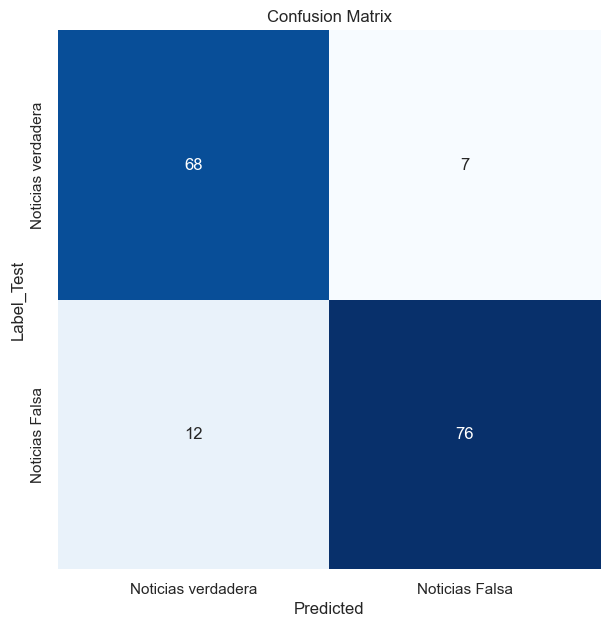

In [56]:
#definimos la matriz de confusión
sns.set(rc={'figure.figsize':(7,7)})
class_names=['Noticias verdadera', 'Noticias Falsa',]
matrix=confusion_matrix(labels_test_2023, y_pred)

#creamos el dataset
dataframe_graf=pd.DataFrame(matrix, index=class_names, columns=class_names)

#dibujamos el mapa de calor
sns.heatmap(dataframe_graf, annot=True, cbar=None, cmap="Blues",fmt='g')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Label_Test")

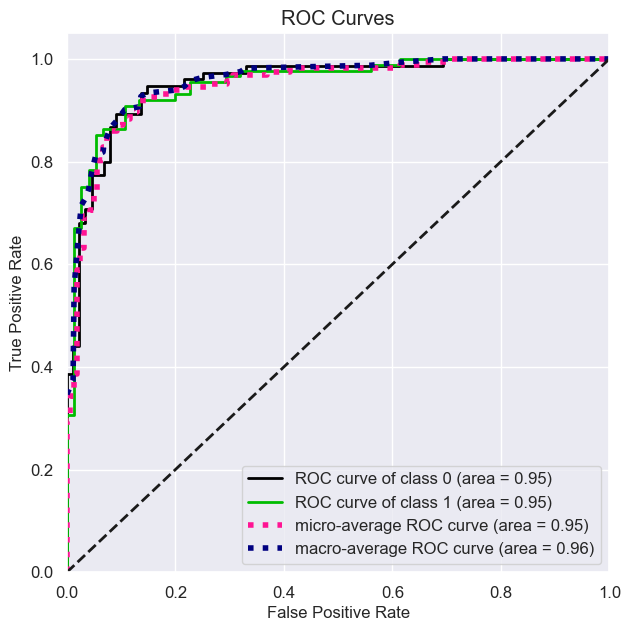

In [57]:
#dibujamos la curva roc 
y_pred_proba= best_logreg_model.predict_proba(features_test_2023)
skplt.metrics.plot_roc_curve(labels_test_2023, y_pred_proba)
plt.show()

<AxesSubplot: title={'center': 'Precision-Recall Curve'}, xlabel='Recall', ylabel='Precision'>

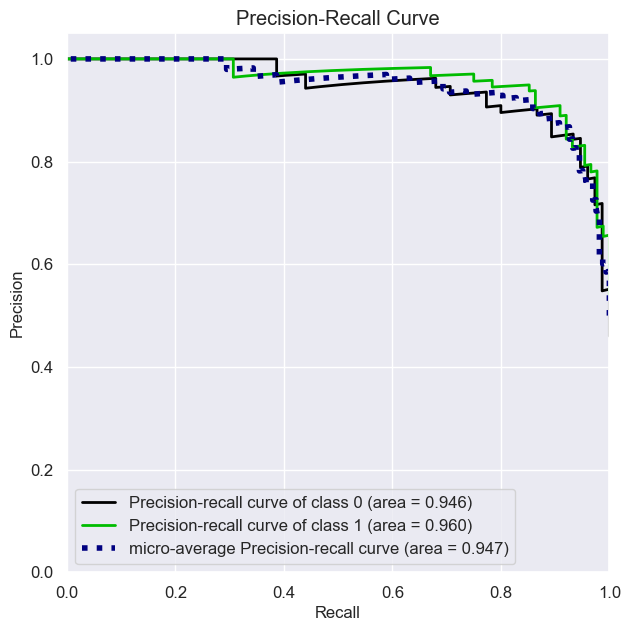

In [58]:
#dibujamos la curva precision-recall
skplt.metrics.plot_precision_recall(labels_test_2023,y_pred_proba)


### 6.1.2 Regresión logística para el dataset concatenado

In [884]:
#específicamos los parámetros que queremos buscar
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga']
}

#instanciamos el modelo
logreg = LogisticRegression(max_iter=2000)  

#creamos el objeto GridSeachCV y establecemos el valor del crossvalidationf
grid_search = GridSearchCV(logreg, param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=1)

#ajustamos el método a los datos del df de 2023
grid_search.fit(features_train_concat, labels_train_concat)

#imprimimos los mejores parámetros 
print("Mejores parámetros encontrados:")
print(grid_search.best_params_)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Mejores parámetros encontrados:
{'C': 10, 'penalty': 'l2', 'solver': 'liblinear'}


In [59]:
#instanciamos el modelo con los mejores parámetros
best_logreg_model_concat = LogisticRegression(C=10, 
                                       penalty='l2', 
                                       solver='liblinear',  
                                       random_state = SEED)

#ajustamos el modelo al dataset 2023
best_logreg_model_concat.fit(features_train_concat, labels_train_concat)

#predecimos y a partir de X
y_pred = best_logreg_model_concat.predict(features_test_concat)

#evaluamos el modelo
accuracy_logreg_concat = accuracy_score(labels_test_concat, y_pred)
report = classification_report(labels_test_concat, y_pred)

#imprimimos los resultados de la evaluación
print("Exactitud (Accuracy):", accuracy_logreg_concat)
print("\nInforme de clasificación:\n", report)

precision, recall, f1_logreg_concat, _ = precision_recall_fscore_support(labels_test_concat, y_pred, average=None)

Exactitud (Accuracy): 0.9103448275862069

Informe de clasificación:
               precision    recall  f1-score   support

           0       0.90      0.93      0.91       147
           1       0.92      0.90      0.91       143

    accuracy                           0.91       290
   macro avg       0.91      0.91      0.91       290
weighted avg       0.91      0.91      0.91       290



Text(54.74999999999999, 0.5, 'Label_Test')

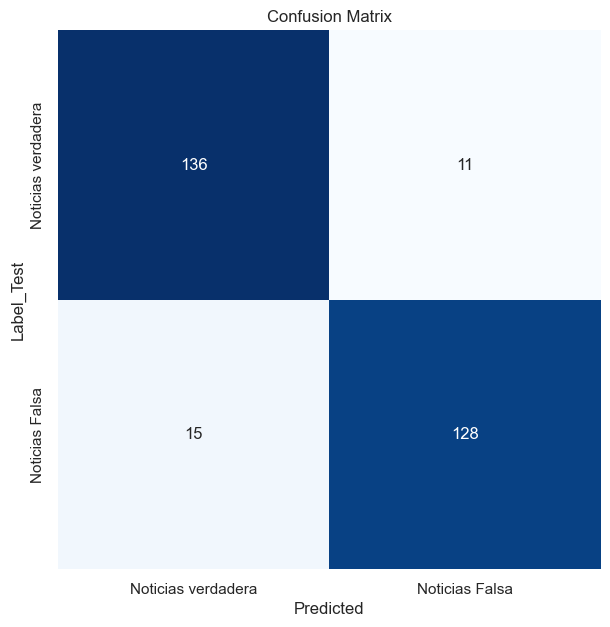

In [60]:
#definimos la matriz de confusión
sns.set(rc={'figure.figsize':(7,7)})
class_names=['Noticias verdadera', 'Noticias Falsa',]
matrix=confusion_matrix(labels_test_concat, y_pred)

#creamos el dataset
dataframe_graf=pd.DataFrame(matrix, index=class_names, columns=class_names)

#dibujamos el mapa de calor
sns.heatmap(dataframe_graf, annot=True, cbar=None, cmap="Blues",fmt='g')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Label_Test")

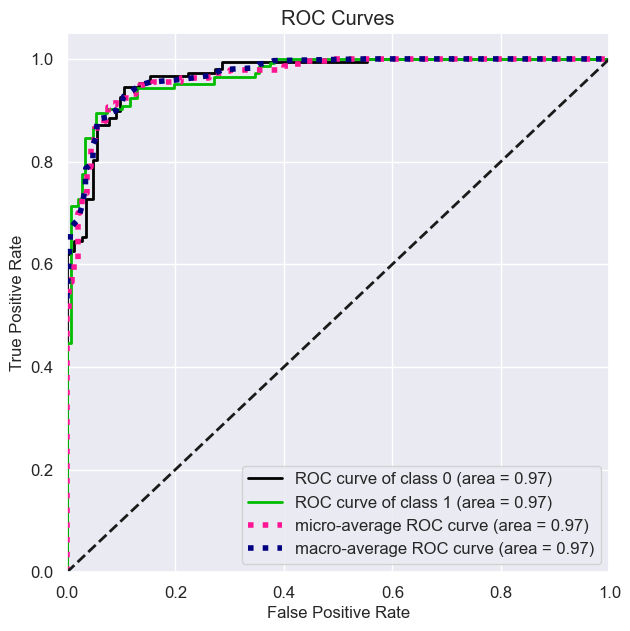

In [61]:
#dibujamos la curva roc 
y_pred_proba= best_logreg_model_concat.predict_proba(features_test_concat)
skplt.metrics.plot_roc_curve(labels_test_concat, y_pred_proba)
plt.show()

<AxesSubplot: title={'center': 'Precision-Recall Curve'}, xlabel='Recall', ylabel='Precision'>

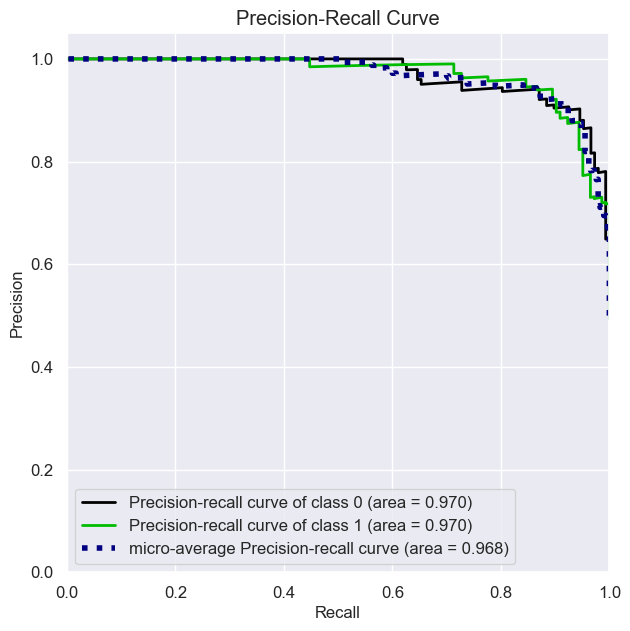

In [62]:
#dibujamos la curva precision-recall
skplt.metrics.plot_precision_recall(labels_test_concat,y_pred_proba)

## 6.2. SVM

### 6.2.1 SVM para el dataset 2023

In [889]:
#determinamos los posibles hiperparámetros
param_grid = {
    'C': [0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
    'gamma': ['scale', 'auto', 0.01, 0.1, 1],
}

#instanciamos el modelo
svm_model = svm.SVC()

#creamos el objeto GridSeachCV y establecemos el valor del crossvalidation
grid_search = GridSearchCV(svm_model, param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=1)

#ajustamos el método a los datos del df de 2023
grid_search.fit(features_train_2023, labels_train_2023)

#imprimimos los mejores parámetros 
print("Mejores parámetros encontrados:")
print(grid_search.best_params_)

Fitting 5 folds for each of 80 candidates, totalling 400 fits
Mejores parámetros encontrados:
{'C': 1, 'gamma': 'scale', 'kernel': 'sigmoid'}


In [63]:
#instanciamos el modelo con los mejores parámetros
best_svm_model = svm.SVC(C=1, 
                         gamma='scale', 
                         kernel='sigmoid',
                         probability=True,  
                         random_state = SEED)

#ajustamos el modelo al dataset 2023
best_svm_model.fit(features_train_2023, labels_train_2023)

#predecimos y a partir de X
y_pred = best_svm_model.predict(features_test_2023)

#evaluamos el modelo
accuracy_svm_2023 = accuracy_score(labels_test_2023, y_pred)
report = classification_report(labels_test_2023, y_pred)

#imprimimos los resultados de la evaluación
print("Exactitud (Accuracy):", accuracy_svm_2023)
print("\nInforme de clasificación:\n", report)

precision, recall, f1_sv_2023, _ = precision_recall_fscore_support(labels_test_2023, y_pred, average=None)

Exactitud (Accuracy): 0.8711656441717791

Informe de clasificación:
               precision    recall  f1-score   support

           0       0.84      0.89      0.86        75
           1       0.90      0.85      0.88        88

    accuracy                           0.87       163
   macro avg       0.87      0.87      0.87       163
weighted avg       0.87      0.87      0.87       163



Text(54.74999999999999, 0.5, 'Label_Test')

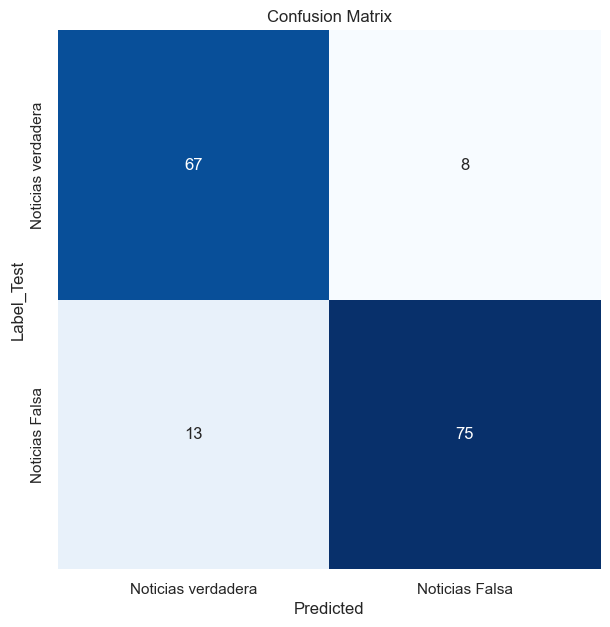

In [64]:
#definimos la matriz de confusión
sns.set(rc={'figure.figsize':(7,7)})
class_names=['Noticias verdadera', 'Noticias Falsa']
matrix=confusion_matrix(labels_test_2023, y_pred)

#creamos el dataset
dataframe_graf=pd.DataFrame(matrix, index=class_names, columns=class_names)

#dibujamos el mapa de calor
sns.heatmap(dataframe_graf, annot=True, cbar=None, cmap="Blues",fmt='g')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Label_Test")

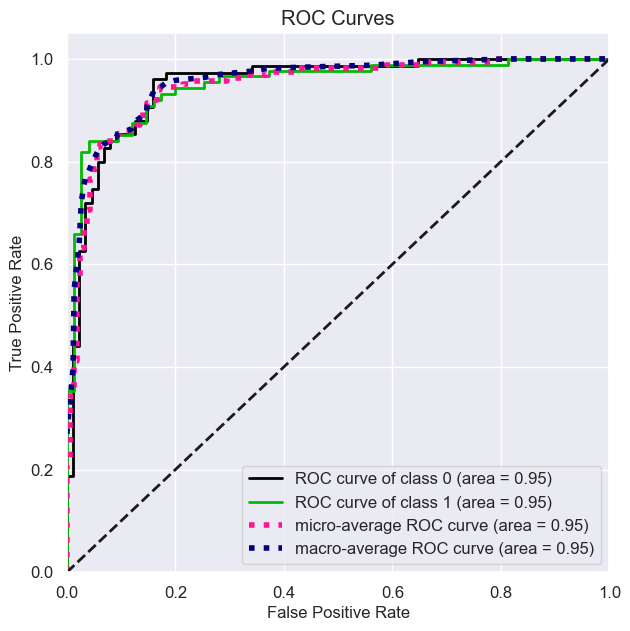

In [65]:
#dibujamos la curva roc 
y_pred_proba= best_svm_model.predict_proba(features_test_2023)
skplt.metrics.plot_roc_curve(labels_test_2023, y_pred_proba)
plt.show()

<AxesSubplot: title={'center': 'Precision-Recall Curve'}, xlabel='Recall', ylabel='Precision'>

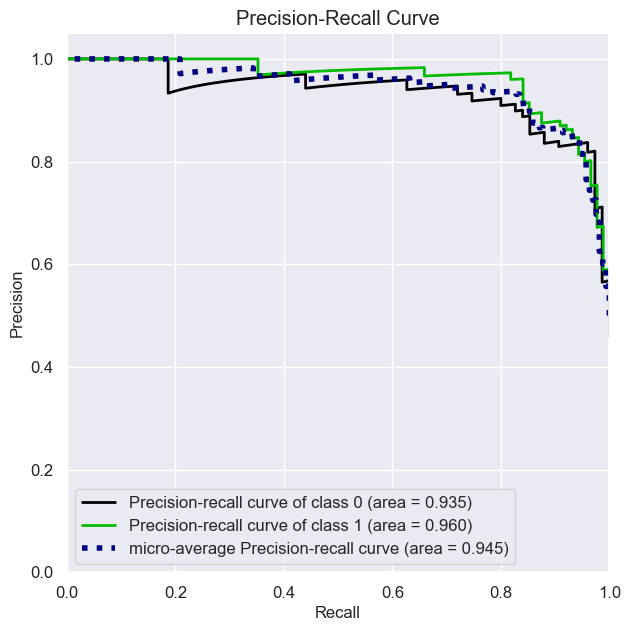

In [66]:
#dibujamos la curva precision-recall
skplt.metrics.plot_precision_recall(labels_test_2023,y_pred_proba)

### 6.2.2 SVM para el dataset concatenado

In [894]:
param_grid = {
    'C': [0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
    'gamma': ['scale', 'auto', 0.01, 0.1, 1],
}

#instanciamos el modelo
svm_model = svm.SVC()


#creamos el objeto GridSeachCV y establecemos el valor del crossvalidation
grid_search = GridSearchCV(svm_model, param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=1)

#ajustamos el método a los datos del df de 2023
grid_search.fit(features_train_concat, labels_train_concat)

#imprimimos los mejores parámetros 
print("Mejores parámetros encontrados:")
print(grid_search.best_params_)

Fitting 5 folds for each of 80 candidates, totalling 400 fits
Mejores parámetros encontrados:
{'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}


In [67]:
#instanciamos el modelo con los mejores parámetros
best_svm_model_concat = svm.SVC(C=10, 
                         gamma='scale', 
                         kernel='rbf',  
                         probability=True,
                         random_state = SEED)

#ajustamos el modelo al dataset 2023
best_svm_model_concat.fit(features_train_concat, labels_train_concat)

#predecimos y a partir de X
y_pred = best_svm_model_concat.predict(features_test_concat)

#evaluamos el modelo
accuracy_svm_concat = accuracy_score(labels_test_concat, y_pred)
report = classification_report(labels_test_concat, y_pred)

#imprimimos los resultados de la evaluación
print("Exactitud (Accuracy):", accuracy_svm_concat)
print("\nInforme de clasificación:\n", report)

precision, recall, f1_sv_concat, _ = precision_recall_fscore_support(labels_test_concat, y_pred, average=None)

Exactitud (Accuracy): 0.9137931034482759

Informe de clasificación:
               precision    recall  f1-score   support

           0       0.91      0.92      0.92       147
           1       0.92      0.91      0.91       143

    accuracy                           0.91       290
   macro avg       0.91      0.91      0.91       290
weighted avg       0.91      0.91      0.91       290



Text(54.74999999999999, 0.5, 'Label_Test')

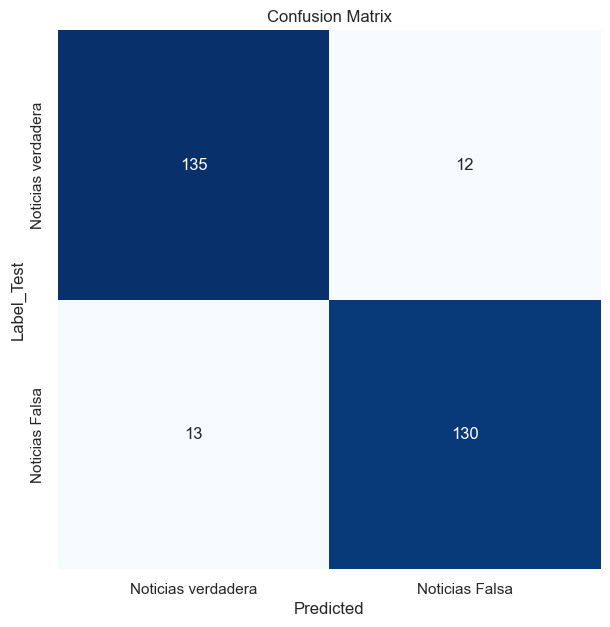

In [68]:
#definimos la matriz de confusión
sns.set(rc={'figure.figsize':(7,7)})
class_names=['Noticias verdadera', 'Noticias Falsa',]
matrix=confusion_matrix(labels_test_concat, y_pred)

#creamos el dataset
dataframe_graf=pd.DataFrame(matrix, index=class_names, columns=class_names)

#dibujamos el mapa de calor
sns.heatmap(dataframe_graf, annot=True, cbar=None, cmap="Blues",fmt='g')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Label_Test")

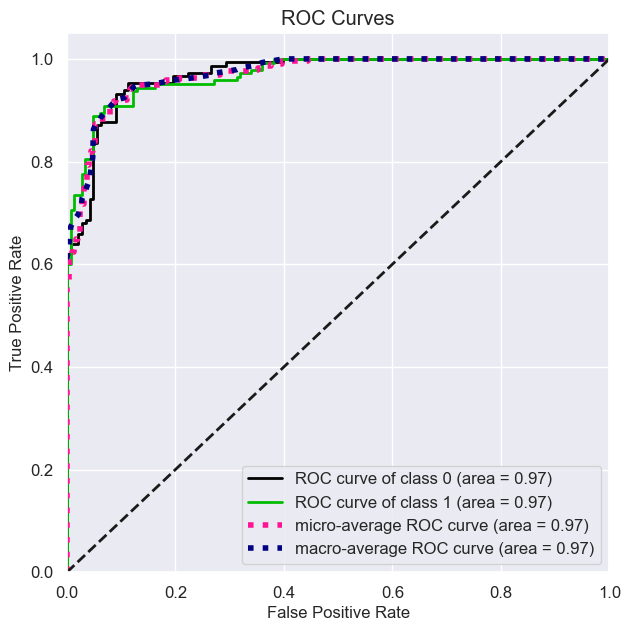

In [69]:
#dibujamos la curva roc 
y_pred_proba= best_svm_model_concat.predict_proba(features_test_concat)
skplt.metrics.plot_roc_curve(labels_test_concat, y_pred_proba)
plt.show()

<AxesSubplot: title={'center': 'Precision-Recall Curve'}, xlabel='Recall', ylabel='Precision'>

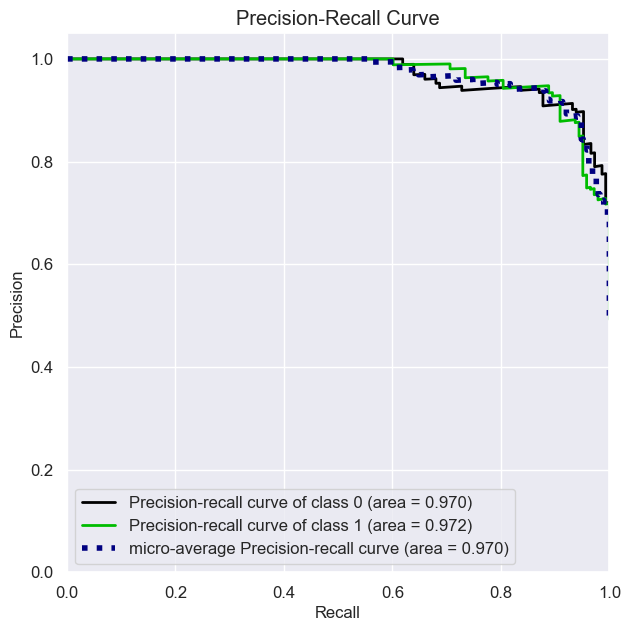

In [70]:
#dibujamos la curva precision-recall
skplt.metrics.plot_precision_recall(labels_test_concat,y_pred_proba)

## 6.3. Naive Bayes

### 6.3.1 Naive Bayes para el dataset 2023

In [899]:
#determinamos los hiperparámetros
param_grid = {
    'alpha': [0.001, 0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0],  # Hiperparámetro de suavización de Laplace
    'fit_prior': [True, False],  # Estimar priors
    'class_prior': [None, [0.3, 0.7], [0.2, 0.8]]  # Priors de clases}
}

#instanciamos el modelo
nb_model = MultinomialNB()

#creamos el objeto GridSeachCV y establecemos el valor del crossvalidation
grid_search = GridSearchCV(nb_model, param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=1)

#ajustamos el método a los datos del df de 2023
grid_search.fit(features_train_2023, labels_train_2023)

#imprimimos los mejores parámetros 
print("Mejores parámetros encontrados:")
print(grid_search.best_params_)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
Mejores parámetros encontrados:
{'alpha': 0.01, 'class_prior': [0.3, 0.7], 'fit_prior': True}


In [71]:
#instanciamos el modelo con los mejores parámetros
best_nb_model = MultinomialNB(alpha= 0.01, 
                              class_prior= [0.3, 0.7], 
                              fit_prior= True 
                              )

#ajustamos el modelo al dataset 2023
best_nb_model.fit(features_train_2023, labels_train_2023)

#predecimos y a partir de X
y_pred = best_nb_model.predict(features_test_2023)

#evaluamos el modelo
accuracy_nb_2023 = accuracy_score(labels_test_2023, y_pred)
report = classification_report(labels_test_2023, y_pred)

#imprimimos los resultados de la evaluación
print("Exactitud (Accuracy):", accuracy_nb_2023)
print("\nInforme de clasificación:\n", report)

precision, recall, f1_nb_2023, _ = precision_recall_fscore_support(labels_test_2023, y_pred, average=None)

Exactitud (Accuracy): 0.8220858895705522

Informe de clasificación:
               precision    recall  f1-score   support

           0       0.79      0.84      0.81        75
           1       0.86      0.81      0.83        88

    accuracy                           0.82       163
   macro avg       0.82      0.82      0.82       163
weighted avg       0.82      0.82      0.82       163



Text(54.74999999999999, 0.5, 'Label_Test')

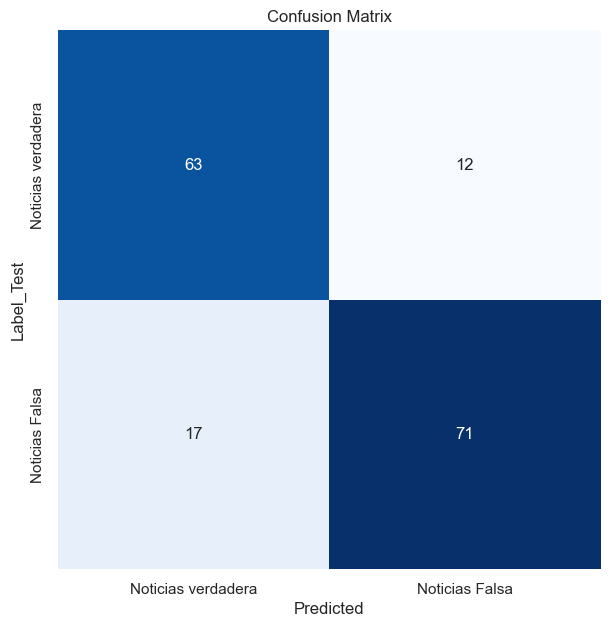

In [72]:
#definimos la matriz de confusión
sns.set(rc={'figure.figsize':(7,7)})
class_names=['Noticias verdadera', 'Noticias Falsa',]
matrix=confusion_matrix(labels_test_2023, y_pred)

#creamos el dataset
dataframe_graf=pd.DataFrame(matrix, index=class_names, columns=class_names)

#dibujamos el mapa de calor
sns.heatmap(dataframe_graf, annot=True, cbar=None, cmap="Blues",fmt='g')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Label_Test")

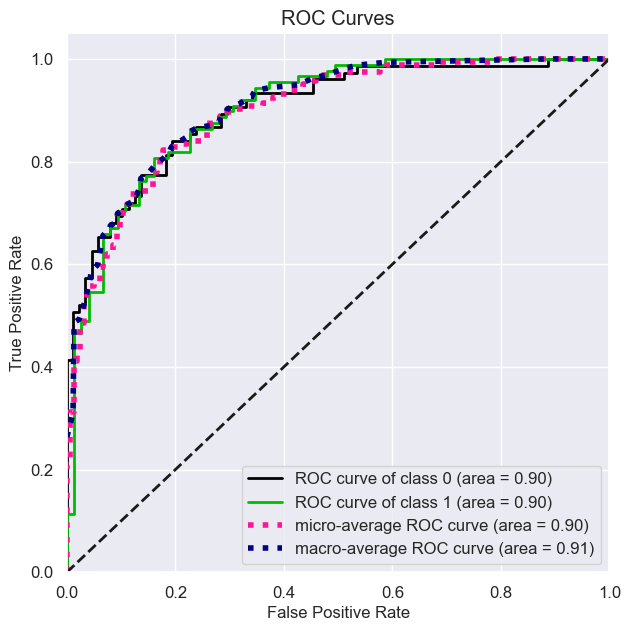

In [73]:
#dibujamos la curva roc 
y_pred_proba= best_nb_model.predict_proba(features_test_2023)
skplt.metrics.plot_roc_curve(labels_test_2023, y_pred_proba)
plt.show()

<AxesSubplot: title={'center': 'Precision-Recall Curve'}, xlabel='Recall', ylabel='Precision'>

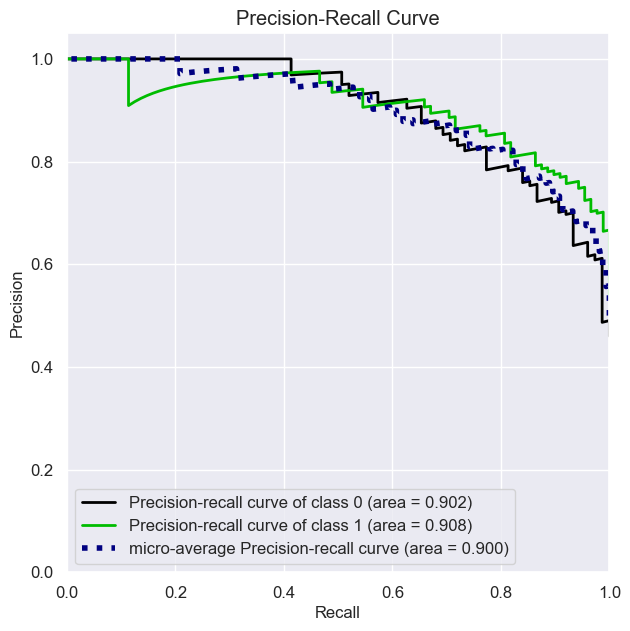

In [74]:
#dibujamos la curva precision-recall
skplt.metrics.plot_precision_recall(labels_test_2023,y_pred_proba)

### 6.3.1 Naive Bayes para el dataset concatenado

In [904]:
#determinamos los hiperparámetros
param_grid = {
    'alpha': [0.001, 0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0],  # Hiperparámetro de suavización de Laplace
    'fit_prior': [True, False],  # Estimar priors
    'class_prior': [None, [0.3, 0.7], [0.2, 0.8]]  # Priors de clases}
}

#instanciamos el modelo
nb_model = MultinomialNB()

#creamos el objeto GridSeachCV y establecemos el valor del crossvalidation
grid_search = GridSearchCV(nb_model, param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=1)

#ajustamos el método a los datos del df de 2023
grid_search.fit(features_train_concat, labels_train_concat)

#imprimimos los mejores parámetros 
print("Mejores parámetros encontrados:")
print(grid_search.best_params_)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
Mejores parámetros encontrados:
{'alpha': 0.1, 'class_prior': [0.3, 0.7], 'fit_prior': True}


In [75]:
#instanciamos el modelo con los mejores parámetros
best_nb_model = MultinomialNB(alpha= 0.1, 
                              class_prior= [0.3, 0.7], 
                              fit_prior= True 
                              )

#ajustamos el modelo al dataset 2023
best_nb_model.fit(features_train_concat, labels_train_concat)

#predecimos y a partir de X
y_pred = best_nb_model.predict(features_test_concat)

#evaluamos el modelo
accuracy_nb_concat = accuracy_score(labels_test_concat, y_pred)
report = classification_report(labels_test_concat, y_pred)

#imprimimos los resultados de la evaluación
print("Exactitud (Accuracy):", accuracy_nb_concat)
print("\nInforme de clasificación:\n", report)

precision, recall, f1_nb_concat, _ = precision_recall_fscore_support(labels_test_concat, y_pred, average=None)

Exactitud (Accuracy): 0.8758620689655172

Informe de clasificación:
               precision    recall  f1-score   support

           0       0.93      0.82      0.87       147
           1       0.83      0.94      0.88       143

    accuracy                           0.88       290
   macro avg       0.88      0.88      0.88       290
weighted avg       0.88      0.88      0.88       290



Text(54.74999999999999, 0.5, 'Label_Test')

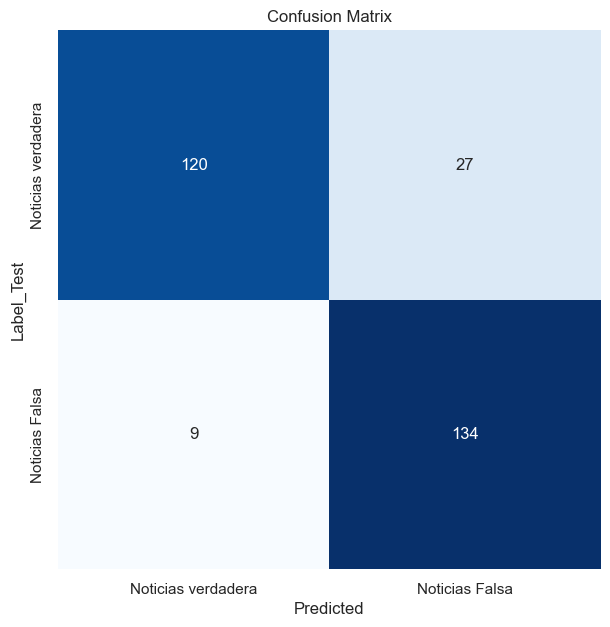

In [76]:
#definimos la matriz de confusión
sns.set(rc={'figure.figsize':(7,7)})
class_names=['Noticias verdadera', 'Noticias Falsa',]
matrix=confusion_matrix(labels_test_concat, y_pred)

#creamos el dataset
dataframe_graf=pd.DataFrame(matrix, index=class_names, columns=class_names)

#dibujamos el mapa de calor
sns.heatmap(dataframe_graf, annot=True, cbar=None, cmap="Blues",fmt='g')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Label_Test")

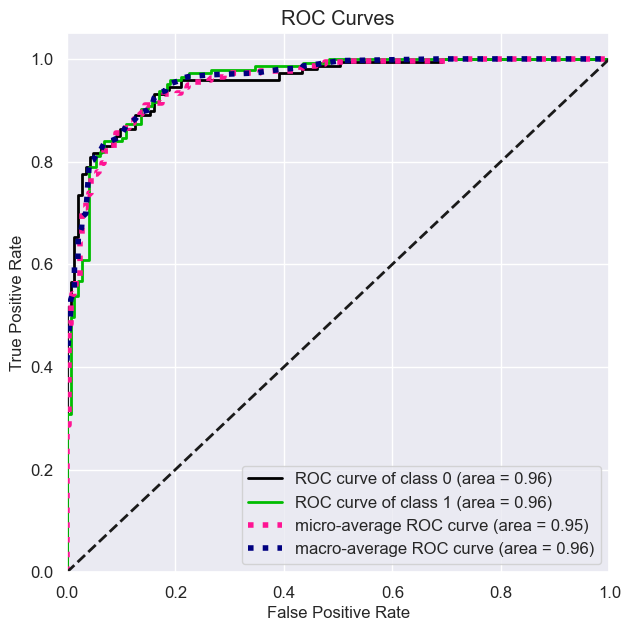

In [77]:
#dibujamos la curva roc 
y_pred_proba= best_nb_model.predict_proba(features_test_concat)
skplt.metrics.plot_roc_curve(labels_test_concat, y_pred_proba)
plt.show()

<AxesSubplot: title={'center': 'Precision-Recall Curve'}, xlabel='Recall', ylabel='Precision'>

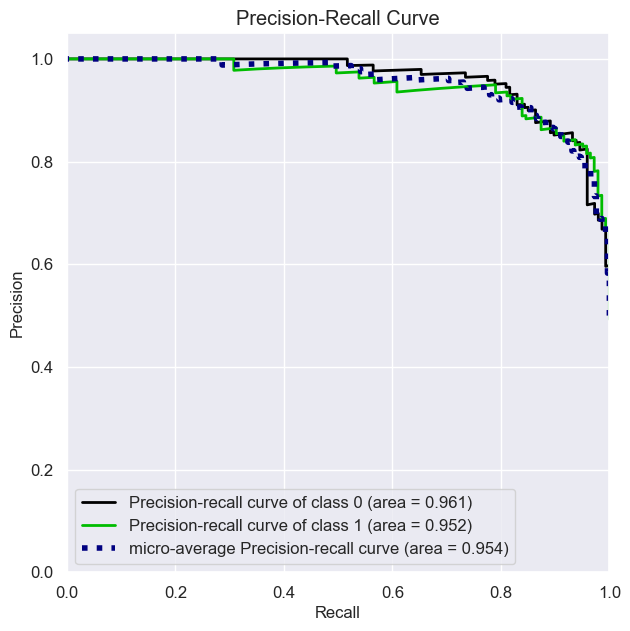

In [78]:
#dibujamos la curva precision-recall
skplt.metrics.plot_precision_recall(labels_test_concat,y_pred_proba)

## 6.4. Random Forest

### 6.4.1 Random Forest para el dataset 2023

In [909]:
#determinamos los hiperparámetros
# n_estimators
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 1000, num = 5)]

# max_depth
max_depth = [int(x) for x in np.linspace(20, 100, num = 5)]
max_depth.append(None)

# min_samples_split
min_samples_split = [2, 5, 10]

# min_samples_leaf
min_samples_leaf = [1, 2, 4]

# bootstrap
bootstrap = [True, False]

#creamos la cuadrícula
param_grid = {'n_estimators': n_estimators,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

#instanciamos el modelo
rf = RandomForestClassifier(random_state=SEED)

#creamos el objeto GridSeachCV y establecemos el valor del crossvalidation
random_search = RandomizedSearchCV(rf, param_grid, n_iter=50, cv=5, 
                                   scoring='accuracy', verbose=1, n_jobs=1, random_state=SEED)

#ajustamos el método a los datos del df de 2023
random_search.fit(features_train_2023, labels_train_2023)

#imprimimos los mejores parámetros 
print("Mejores parámetros encontrados:")
print(random_search.best_params_)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Mejores parámetros encontrados:
{'n_estimators': 600, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': 100, 'bootstrap': False}


In [79]:
#instanciamos el modelo con los mejores parámetros
best_rf_model = RandomForestClassifier(n_estimators= 600, 
                                       min_samples_split= 5, 
                                       min_samples_leaf= 1,
                                       max_depth=100, 
                                       bootstrap=False, 
                                       random_state=SEED
                              )

#ajustamos el modelo al dataset 2023
best_rf_model.fit(features_train_2023, labels_train_2023)

#predecimos y a partir de X
y_pred = best_rf_model.predict(features_test_2023)

#evaluamos el modelo
accuracy_rf_2023 = accuracy_score(labels_test_2023, y_pred)
report = classification_report(labels_test_2023, y_pred)

#imprimimos los resultados de la evaluación
print("Exactitud (Accuracy):", accuracy_rf_2023)
print("\nInforme de clasificación:\n", report)

precision, recall, f1_rf_2023, _ = precision_recall_fscore_support(labels_test_2023, y_pred, average=None)

Exactitud (Accuracy): 0.8650306748466258

Informe de clasificación:
               precision    recall  f1-score   support

           0       0.84      0.87      0.86        75
           1       0.88      0.86      0.87        88

    accuracy                           0.87       163
   macro avg       0.86      0.87      0.86       163
weighted avg       0.87      0.87      0.87       163



Text(54.74999999999999, 0.5, 'Label_Test')

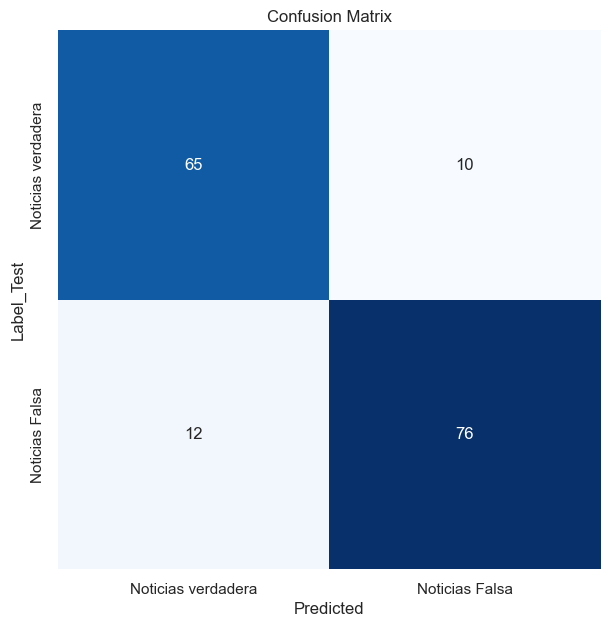

In [80]:
#definimos la matriz de confusión
sns.set(rc={'figure.figsize':(7,7)})
class_names=['Noticias verdadera', 'Noticias Falsa',]
matrix=confusion_matrix(labels_test_2023, y_pred)

#creamos el dataset
dataframe_graf=pd.DataFrame(matrix, index=class_names, columns=class_names)

#dibujamos el mapa de calor
sns.heatmap(dataframe_graf, annot=True, cbar=None, cmap="Blues",fmt='g')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Label_Test")

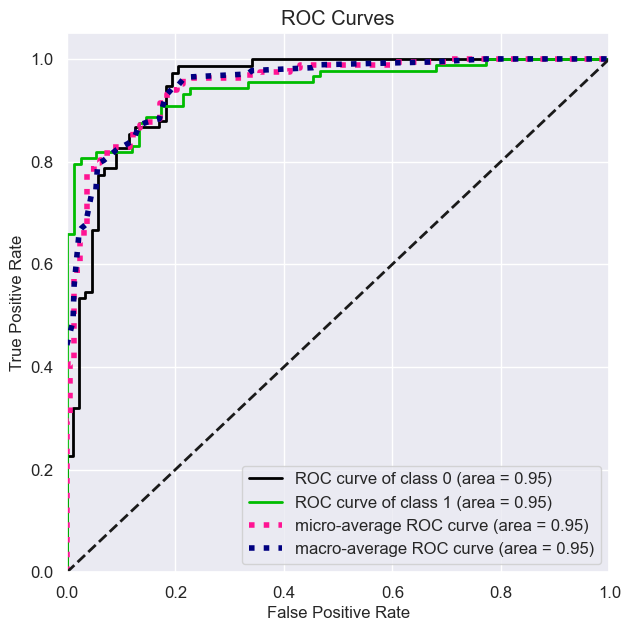

In [81]:
#dibujamos la curva roc 
y_pred_proba= best_rf_model.predict_proba(features_test_2023)
skplt.metrics.plot_roc_curve(labels_test_2023, y_pred_proba)
plt.show()

<AxesSubplot: title={'center': 'Precision-Recall Curve'}, xlabel='Recall', ylabel='Precision'>

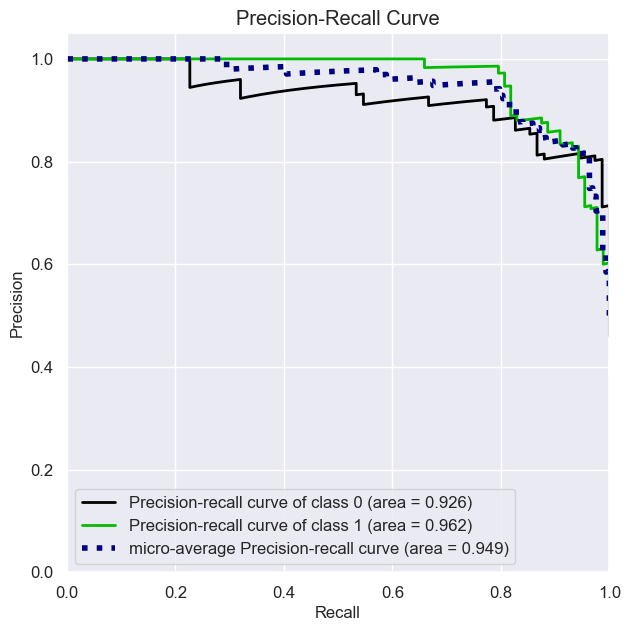

In [82]:
#dibujamos la curva precision-recall
skplt.metrics.plot_precision_recall(labels_test_2023,y_pred_proba)

### 6.4.2 Random Forest para el dataset concatenado

In [914]:
#determinamos los hiperparámetros
# n_estimators
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 1000, num = 5)]

# max_depth
max_depth = [int(x) for x in np.linspace(20, 100, num = 5)]
max_depth.append(None)

# min_samples_split
min_samples_split = [2, 5, 10]

# min_samples_leaf
min_samples_leaf = [1, 2, 4]

# bootstrap
bootstrap = [True, False]

#creamos la cuadrícula
param_grid = {'n_estimators': n_estimators,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

#instanciamos el modelo
rf = RandomForestClassifier(random_state=SEED)

#creamos el objeto random_search y establecemos el valor del crossvalidation
random_search = RandomizedSearchCV(rf, param_grid, n_iter=50, cv=5, 
                                   scoring='accuracy', verbose=1, n_jobs=1, random_state=SEED)

#ajustamos el método a los datos del df concat
random_search.fit(features_train_concat, labels_train_concat)

#imprimimos los mejores parámetros 
print("Mejores parámetros encontrados:")
print(random_search.best_params_)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Mejores parámetros encontrados:
{'n_estimators': 400, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_depth': 60, 'bootstrap': True}


In [83]:
#instanciamos el modelo con los mejores parámetros
best_rf_model = RandomForestClassifier(n_estimators= 400, 
                                       min_samples_split= 10, 
                                       min_samples_leaf= 1,
                                       max_depth=60, 
                                       bootstrap=True, 
                                       random_state=SEED
                              )

#ajustamos el modelo al dataset concat
best_rf_model.fit(features_train_concat, labels_train_concat)

#predecimos y a partir de X
y_pred = best_rf_model.predict(features_test_concat)

#evaluamos el modelo
accuracy_rf_concat = accuracy_score(labels_test_concat, y_pred)
report = classification_report(labels_test_concat, y_pred)

#imprimimos los resultados de la evaluación
print("Exactitud (Accuracy):", accuracy_rf_concat)
print("\nInforme de clasificación:\n", report)

precision, recall, f1_rf_concat, _ = precision_recall_fscore_support(labels_test_concat, y_pred, average=None)

Exactitud (Accuracy): 0.8758620689655172

Informe de clasificación:
               precision    recall  f1-score   support

           0       0.85      0.92      0.88       147
           1       0.91      0.83      0.87       143

    accuracy                           0.88       290
   macro avg       0.88      0.88      0.88       290
weighted avg       0.88      0.88      0.88       290



Text(54.74999999999999, 0.5, 'Label_Test')

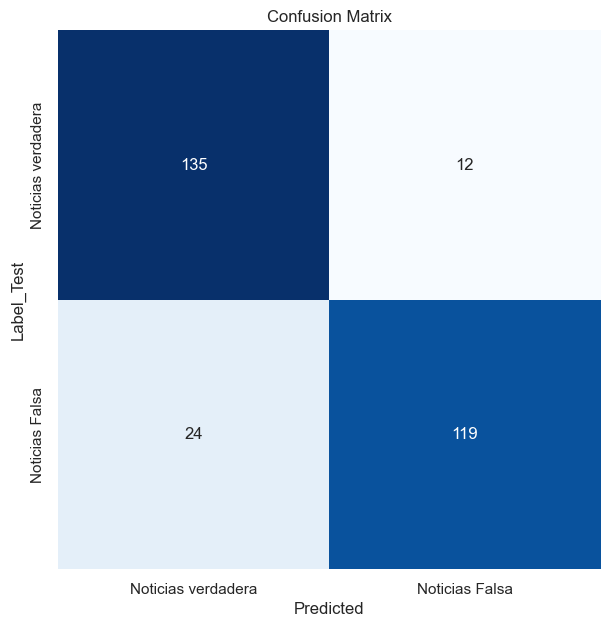

In [84]:
#definimos la matriz de confusión
sns.set(rc={'figure.figsize':(7,7)})
class_names=['Noticias verdadera', 'Noticias Falsa',]
matrix=confusion_matrix(labels_test_concat, y_pred)

#creamos el dataset
dataframe_graf=pd.DataFrame(matrix, index=class_names, columns=class_names)

#dibujamos el mapa de calor
sns.heatmap(dataframe_graf, annot=True, cbar=None, cmap="Blues",fmt='g')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Label_Test")

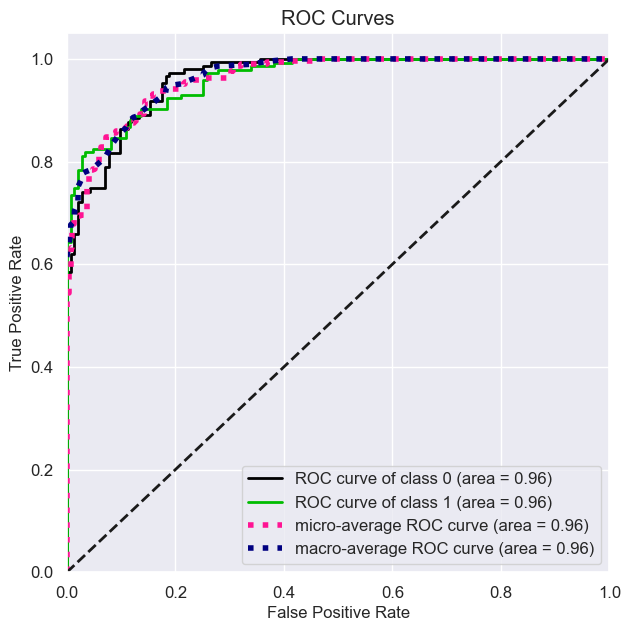

In [85]:
#dibujamos la curva roc 
y_pred_proba= best_rf_model.predict_proba(features_test_concat)
skplt.metrics.plot_roc_curve(labels_test_concat, y_pred_proba)
plt.show()

<AxesSubplot: title={'center': 'Precision-Recall Curve'}, xlabel='Recall', ylabel='Precision'>

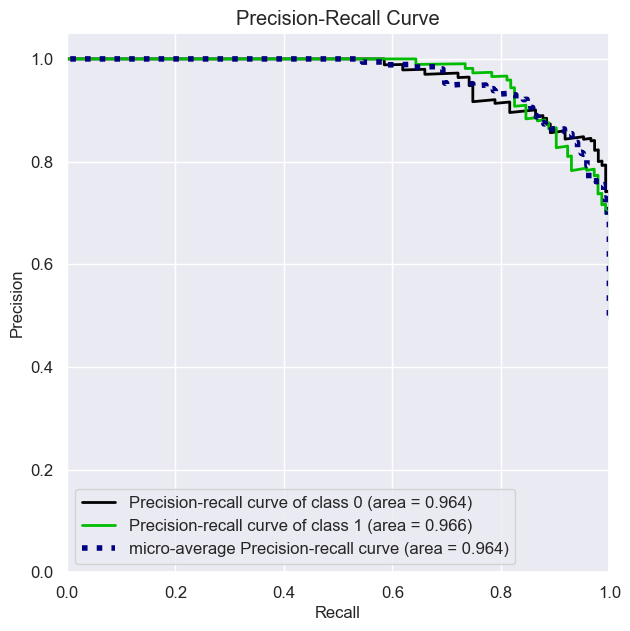

In [86]:
#dibujamos la curva precision-recall
skplt.metrics.plot_precision_recall(labels_test_concat,y_pred_proba)

## 6.5 XGBoost 

### 6.5.1 XGBoost para el dataset 2023

In [919]:
#determinamos los hiperparámetros
param_grid={'colsample_bytree' : [0.3, 0.5, 1.0],
            'gamma' : [0.1, 1, 1.5],
            'learning_rate' : [0.1, 0.01, 0.05,0.9],
            'min_child_weight' : [1, 5, 10],
            'scale_pos_weight' : [1, 2, 4],
            'subsample' : [0.8, 0.9, 1.0],
            'n_estimators' : [int(x) for x in np.linspace(start = 200, stop = 1000, num = 5)],
            'max_depth' : [3,5,7,9],
            'reg_alpha':[0.1, 0.01, 0.05]
            }

#instanciamos el modelo
xgb = XGBClassifier(objective='binary:logistic', nthread=4, random_state=SEED)

#creamos el objeto random_search y establecemos el valor del crossvalidation
random_search = RandomizedSearchCV(xgb, param_grid, n_iter=50, cv=5, 
                                   scoring='accuracy', verbose=1, n_jobs=1, random_state=SEED)

#ajustamos el método a los datos del df concat
random_search.fit(features_train_2023, labels_train_2023)

#imprimimos los mejores parámetros 
print("Mejores parámetros encontrados:")
print(random_search.best_params_)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Mejores parámetros encontrados:
{'subsample': 1.0, 'scale_pos_weight': 2, 'reg_alpha': 0.05, 'n_estimators': 400, 'min_child_weight': 1, 'max_depth': 7, 'learning_rate': 0.1, 'gamma': 0.1, 'colsample_bytree': 0.3}


In [87]:
#instanciamos el modelo con los mejores parámetros
best_xgb_model = XGBClassifier(objective='binary:logistic',
                               colsample_bytree= 0.3,
                               gamma= 0.1,
                               learning_rate= 0.1 ,
                               min_child_weight= 1,
                               scale_pos_weight= 2,
                               subsample= 1.0,
                               n_estimators= 400,
                               max_depth = 7, 
                               reg_alpha = 0.05, 
                               nthread=4, 
                               random_state=SEED)
                            

#ajustamos el modelo al dataset 2023
best_xgb_model.fit(features_train_2023, labels_train_2023)

#predecimos y a partir de X
y_pred = best_xgb_model.predict(features_test_2023)

#evaluamos el modelo
accuracy_xgb_2023 = accuracy_score(labels_test_2023, y_pred)
report = classification_report(labels_test_2023, y_pred)

#imprimimos los resultados de la evaluación
print("Exactitud (Accuracy):", accuracy_xgb_2023)
print("\nInforme de clasificación:\n", report)

precision, recall, f1_xgb_2023, _ = precision_recall_fscore_support(labels_test_2023, y_pred, average=None)

Exactitud (Accuracy): 0.8343558282208589

Informe de clasificación:
               precision    recall  f1-score   support

           0       0.85      0.77      0.81        75
           1       0.82      0.89      0.85        88

    accuracy                           0.83       163
   macro avg       0.84      0.83      0.83       163
weighted avg       0.84      0.83      0.83       163



Text(54.74999999999999, 0.5, 'Label_Test')

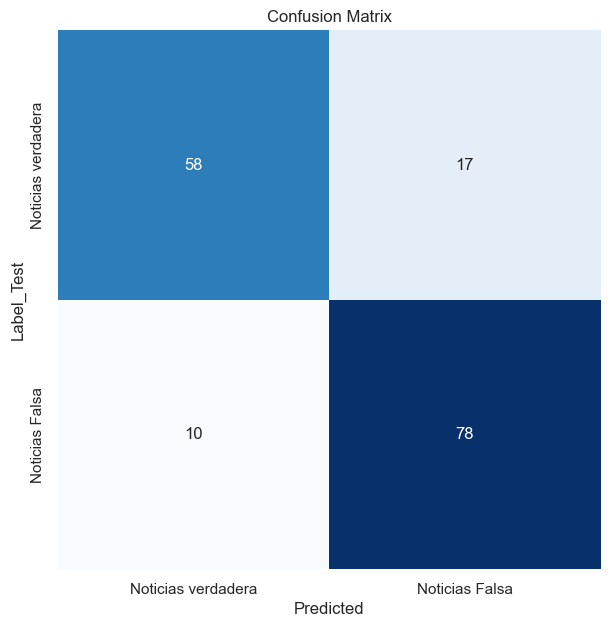

In [88]:
#definimos la matriz de confusión
sns.set(rc={'figure.figsize':(7,7)})
class_names=['Noticias verdadera', 'Noticias Falsa',]
matrix=confusion_matrix(labels_test_2023, y_pred)

#creamos el dataset
dataframe_graf=pd.DataFrame(matrix, index=class_names, columns=class_names)

#dibujamos el mapa de calor
sns.heatmap(dataframe_graf, annot=True, cbar=None, cmap="Blues",fmt='g')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Label_Test")

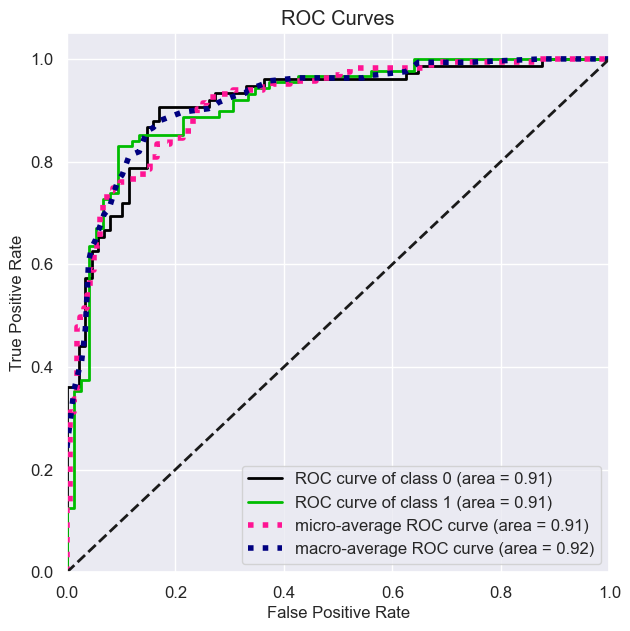

In [89]:
#dibujamos la curva roc 
y_pred_proba= best_xgb_model.predict_proba(features_test_2023)
skplt.metrics.plot_roc_curve(labels_test_2023, y_pred_proba)
plt.show()

<AxesSubplot: title={'center': 'Precision-Recall Curve'}, xlabel='Recall', ylabel='Precision'>

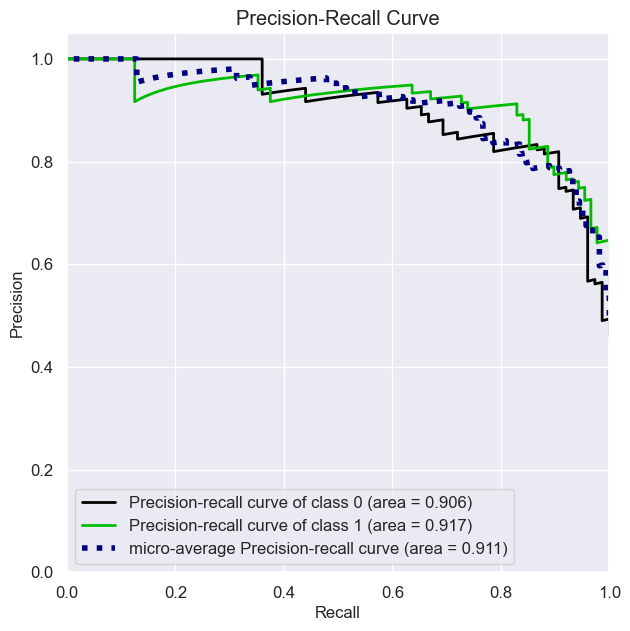

In [90]:
#dibujamos la curva precision-recall
skplt.metrics.plot_precision_recall(labels_test_2023,y_pred_proba)

### 6.5.2 XGBoost para el dataset concatenado

In [924]:
#determinamos los hiperparámetros
param_grid={'colsample_bytree' : [0.3, 0.5, 1.0],
            'gamma' : [0.1, 1, 1.5],
            'learning_rate' : [0.1, 0.01, 0.05,0.9],
            'min_child_weight' : [1, 5, 10],
            'scale_pos_weight' : [1, 2, 4],
            'subsample' : [0.8, 0.9, 1.0],
            'n_estimators' : [int(x) for x in np.linspace(start = 200, stop = 1000, num = 5)],
            'max_depth' : [3,5,7,9],
            'reg_alpha':[0.1, 0.01, 0.05]
            }

#instanciamos el modelo
xgb = XGBClassifier(objective='binary:logistic', nthread=4, random_state=SEED)

#creamos el objeto random_search y establecemos el valor del crossvalidation
random_search = RandomizedSearchCV(xgb, param_grid, n_iter=50, cv=5, 
                                   scoring='accuracy', verbose=1, n_jobs=1, random_state=SEED)

#ajustamos el método a los datos del df concat
random_search.fit(features_train_concat, labels_train_concat)

#imprimimos los mejores parámetros 
print("Mejores parámetros encontrados:")
print(random_search.best_params_)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Mejores parámetros encontrados:
{'subsample': 0.9, 'scale_pos_weight': 1, 'reg_alpha': 0.05, 'n_estimators': 1000, 'min_child_weight': 1, 'max_depth': 9, 'learning_rate': 0.05, 'gamma': 1.5, 'colsample_bytree': 1.0}


In [91]:
#instanciamos el modelo con los mejores parámetros
best_xgb_model = XGBClassifier(objective='binary:logistic',
                               colsample_bytree= 1.0,
                               gamma= 1.5,
                               learning_rate= 0.05,
                               min_child_weight= 1,
                               scale_pos_weight= 1,
                               subsample= 0.9,
                               n_estimators= 1000,
                               max_depth = 9, 
                               reg_alpha = 0.05, 
                               nthread=4, 
                               random_state=SEED)
                            

#ajustamos el modelo al dataset concatenado
best_xgb_model.fit(features_train_concat, labels_train_concat)

#predecimos y a partir de X
y_pred = best_xgb_model.predict(features_test_concat)

#evaluamos el modelo
accuracy_xgb_concat = accuracy_score(labels_test_concat, y_pred)
report = classification_report(labels_test_concat, y_pred)

#imprimimos los resultados de la evaluación
print("Exactitud (Accuracy):", accuracy_xgb_concat)
print("\nInforme de clasificación:\n", report)

precision, recall, f1_xgb_concat, _ = precision_recall_fscore_support(labels_test_concat, y_pred, average=None)

Exactitud (Accuracy): 0.8517241379310345

Informe de clasificación:
               precision    recall  f1-score   support

           0       0.86      0.85      0.85       147
           1       0.85      0.85      0.85       143

    accuracy                           0.85       290
   macro avg       0.85      0.85      0.85       290
weighted avg       0.85      0.85      0.85       290



Text(54.74999999999999, 0.5, 'Label_Test')

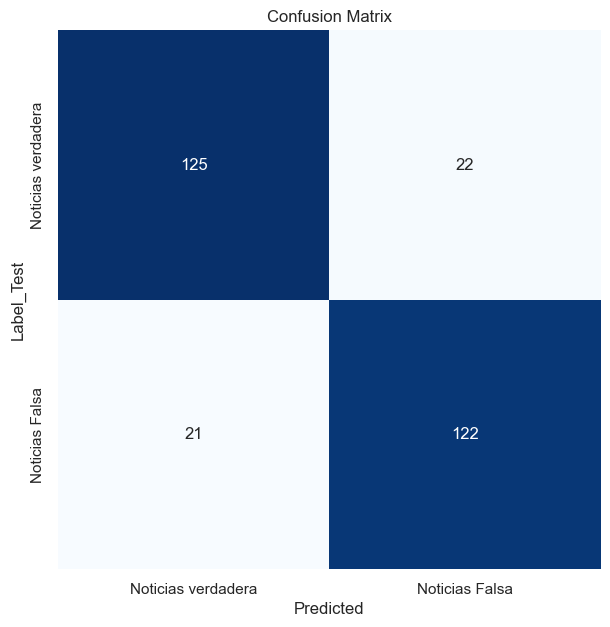

In [92]:
#definimos la matriz de confusión
sns.set(rc={'figure.figsize':(7,7)})
class_names=['Noticias verdadera', 'Noticias Falsa',]
matrix=confusion_matrix(labels_test_concat, y_pred)

#creamos el dataset
dataframe_graf=pd.DataFrame(matrix, index=class_names, columns=class_names)

#dibujamos el mapa de calor
sns.heatmap(dataframe_graf, annot=True, cbar=None, cmap="Blues",fmt='g')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Label_Test")

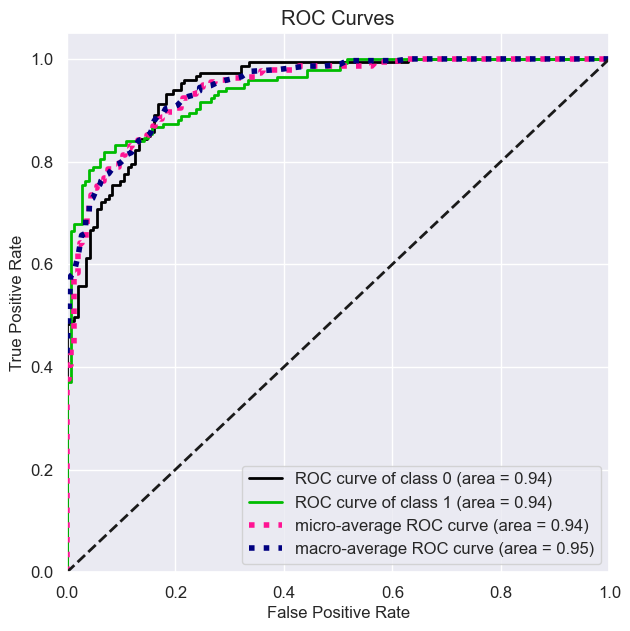

In [93]:
#dibujamos la curva roc 
y_pred_proba= best_xgb_model.predict_proba(features_test_concat)
skplt.metrics.plot_roc_curve(labels_test_concat, y_pred_proba)
plt.show()

<AxesSubplot: title={'center': 'Precision-Recall Curve'}, xlabel='Recall', ylabel='Precision'>

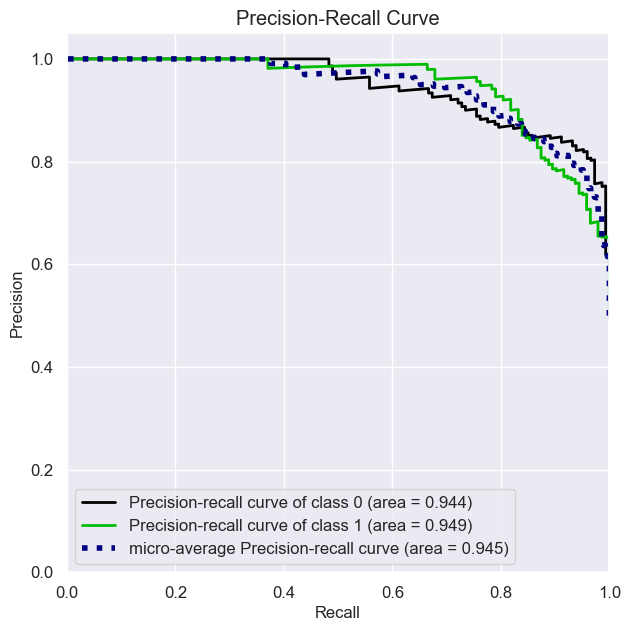

In [94]:
#dibujamos la curva precision-recall
skplt.metrics.plot_precision_recall(labels_test_concat,y_pred_proba)

# 7. Comparación de modelos

Antes que nada observemos los resultados de la investigación de Flores y Montaño

Para el data set 2022 (accuracy): 
- Random Forest: 0.897638
- Naives Bayes: 0.905512
- SVM: 0.913386
- Regresión Logística: 0.905512 
- XGBoost: 0.874016

Para el dataset ampliado (accuracy): 
- Random Forest: 0.708459
- Naives Bayes: 0.699396
- SVM: 0.737160
- Regresión Logística: 0.728097 
- XGBoost: 0.714502


Podemos ver que contrario a la intuición los modelos mejor puntuados no son aquellos que se implementaron en el dataset ampliado sino aquellos que utilizados en el dataset más pequeño. 

Esto podría deberse a que:
- los criterios de extracción de la información no fueron uniformes 
- a que, como lo habíamos mencionado antes, la lemantización se hizo en ingles sobre un texto en español 
- el preprocesamiento del texto del dataset ampliado no fue realizado correctamente. 

Ahora examinaré los resultados de la implementación de los modelos en el conjunto de datos de 2023 y en el dataset concatenado


In [182]:
#construimos un diccionario con el nombre del modelo y dos métricas: accuracy y f1 para la clase 0 y para la clase 1

data = {
    'Modelo': ['Regresión Logística', 'SVM', 'Naives Bayes', 'Random Forest', 'XGBoost'],
    'Accuracy_2023': [accuracy_logreg_2023, accuracy_svm_2023, accuracy_nb_2023, accuracy_rf_2023, accuracy_xgb_2023],
    'F1_2023_0': [f1_logreg_2023[0], f1_sv_2023[0], f1_nb_2023[0], f1_rf_2023[0], f1_xgb_2023[0]],
    'F1_2023_1': [f1_logreg_2023[1], f1_sv_2023[1], f1_nb_2023[1], f1_rf_2023[1], f1_xgb_2023[1]],
    'Accuracy_Concat': [accuracy_logreg_concat, accuracy_svm_concat, accuracy_nb_concat, accuracy_rf_concat, accuracy_xgb_concat],
    'F1_Concat_0': [f1_logreg_concat[0], f1_sv_concat[0], f1_nb_concat[0], f1_rf_concat[0], f1_xgb_concat[0]],
    'F1_Concat_1': [f1_logreg_concat[1], f1_sv_concat[1], f1_nb_concat[1], f1_rf_concat[1], f1_xgb_concat[1]]
}

#creamos un df con todas las métricas y comparamos
df_evaluation = pd.DataFrame(data)

df_evaluation

,Modelo,Accuracy_2023,F1_2023_0,F1_2023_1,Accuracy_Concat,F1_Concat_0,F1_Concat_1
0,Regresión Logística,0.883436,0.877419,0.888889,0.910345,0.912752,0.907801
1,SVM,0.871166,0.864516,0.877193,0.913793,0.915254,0.912281
2,Naives Bayes,0.822086,0.812903,0.830409,0.875862,0.869565,0.881579
3,Random Forest,0.865031,0.855263,0.873563,0.875862,0.882353,0.868613
4,XGBoost,0.834356,0.811189,0.852459,0.851724,0.853242,0.850174


En este caso sí que vemos que en todos los casos las métricas (accuracy y f1 para 0 y f1 para 1) mejoran con el dataset concatenado. 

Los mejores resultados los obtiene el SVM tanto para el dataset 2023 como para el dataset concatenado. 

Es importante observar que los modelos más complejos (random forest y xgboos) no presentan los peores resultados.

Respecto a la comparación con los resultados de Flores y Montaño puedo decir que el mejor modelo es SVM pero en mi caso es el SVM implementado en el dataset concatenado. 

Finalmente, concluyo que el mejor modelo, con el cuál clasificaré como falsas o ciertas un conjunto nuevo de noticias, es 'best_svm_model_concat'

# 8. Evaluación del mejor modelo con noticias nuevas 

En este apartado importé un dataset con noticias nuevas falsas y verdaderas para comprobar si el mejor modelo lograba clasificarlas correctamente. 

En el nuevo dataset incluí: 

- 0 y 1: Noticias satíricas. Falsas
- 2 y 3: Bulos de redes sociales. Verificadas por ColombiaCheck - como Falsas 
- 4 y 5: Noticias reales extraídas de El Espectador. Verdaderas
- 6: La noticia del chicharrón. Falsa
- 7: Noticia sobre salud mundial extraída de El Espectador. Verdadera. 

In [273]:
df_detector = pd.read_excel('pruebas_fakenews_detector.xlsx', engine='openpyxl', converters={'Texto': str})

In [274]:
df_detector[['titulo','label', 'tipo']]

,titulo,label,tipo
0,Nuevo uniforme de la Policía será reversible,1,sátira
1,Botiquines de vehículos deberán incluir frasco de ayahuasca,1,sátira
2,Ayudenos a pasar esta información! En los próximos días habrá un Domo Atmosférico de Calor,1,evidentemente falsa
3,Fallo de la Corte Suprema de Estados Unidos: Las vacunas contra el Covid NO son vacunas,1,evidentemente falsa
4,Petro reconoce responsabilidad de su Gobierno y el de Duque en pérdida de Panamericanos,0,evidentemente cierta
5,"Capturan a alias Tato y a alias Gordo, dos de los hombres más buscado de Antioquia",0,evidentemente cierta
6,"El chicharrón es más saludable que algunas verduras, según un nuevo estudio",1,salud
7,El director de la OMS pide acabar con el estigma y la discriminación de la lepra,0,salud


In [194]:
news_list = df_detector['texto'].tolist()
# 1, 1, 1, 1, 0, 0, 1, 0. 

In [190]:
def detection_fake_news_(news_list, model, threshold=0.5):
    preprocessed_news = [text_preprocessing(news) for news in news_list]
    
    # Transformar todas las noticias en un solo paso
    vectorized_input_data = tfidf_concat.transform(preprocessed_news)
    
    # Obtener las probabilidades de ser falsas para todas las noticias
    prediction_probas = model.predict_proba(vectorized_input_data)[:, 1]
    
    # Aplicar el umbral y obtener los labels binarios
    prediction_labels = (prediction_probas > threshold).astype(int)
    
    # Retornar los labels binarios
    return prediction_labels

In [191]:
detection_fake_news_(news_list, best_svm_model_concat)

array([0, 0, 1, 1, 1, 0, 0, 0])

Con el label binario (0 / 1) el mejor modelo solo acertó en la clasificación de las noticias 2 y 3 como falsas y 5 y 7 como verdaderas. 

In [271]:
def detection_fake_news_batch(news_list, model):
    preprocessed_news = [text_preprocessing(news) for news in news_list]
    
    # Transformar todas las noticias en un solo paso
    vectorized_input_data = tfidf_concat.transform(preprocessed_news)
    
    # Obtener las probabilidades de ser falsas para todas las noticias
    prediction_probas = model.predict_proba(vectorized_input_data)[:, 1]
    
    # Imprimir los resultados de manera legible para cada noticia en la lista
    for i, prob in enumerate(prediction_probas):
        print(f"La noticia {i} tiene una probabilidad del {prob:.2%} de ser falsa.")

In [272]:
news_list = df_detector['texto'].tolist()
detection_fake_news_batch(news_list, best_svm_model_concat)

La noticia 0 tiene una probabilidad del 22.60% de ser falsa.
La noticia 1 tiene una probabilidad del 27.40% de ser falsa.
La noticia 2 tiene una probabilidad del 91.97% de ser falsa.
La noticia 3 tiene una probabilidad del 85.48% de ser falsa.
La noticia 4 tiene una probabilidad del 54.54% de ser falsa.
La noticia 5 tiene una probabilidad del 2.70% de ser falsa.
La noticia 6 tiene una probabilidad del 34.27% de ser falsa.
La noticia 7 tiene una probabilidad del 17.95% de ser falsa.


Con los resultados en probabilidades puedo concluir que: 
  - Las noticias satíricas (0 y 1) en un alto porcentaje las asume como ciertas
   - El acierto porcentual es bastante alto con las noticias falsas de redes sociales. 
   - A la noticia del chicharrón le asigna una probabilidad porcentual muy alta de ser verdadera (solo el 34.27% de probabilidad de ser falsa)
   - A la noticia cierta 4 le da una posibilidad un poco más alta que el azar de ser falsa. A la noticia 5 si que la califica categóricamente con verdadera. 

# 9. Conclusiones parciales

Puedo concluir, entonces, que:
   - Aunque el modelo tiene muy buenas métricas, a la hora de clasificar nuevas noticias verdaderas y falsas se equivoca de manera consistente. 
   
   -  Puedo decir, basado solamente en el conjunto de nuevas noticias, que el modelo tiene la habilidad de clasificar bien como falsas noticias que son evidentemente falsas. Se le dificulta clasificar aquellas noticias que intentan generar más confusión, como es el caso de las noticias satíricas. 
   
   -   Es de resaltar, que a la noticia sobre las propiedades saludables del chicharrón le da una alta probabilidad de ser cierta. 
    
   - En general, puedo afirmar que no existe un criterio discernible de clasificación a excepción de la capacidad del modelo para acertar con las noticias evidentemente falsas. 
    
   - Es evidente la necesidad de utilizar modelos más sofisticados basados en conjuntos de datos más grandes. 
    

# 10. Bibliografia

- Ansar, W., & Goswami, S. (2021). Combating the menace: A survey on characterization and detection of fake news from a data science perspective. International Journal of Information Management Data Insights, 1(2), 100052. ISSN 2667-0968.

- Flores Quinayás, J. E., & Montaño Morcillo, J. G. (2022). Modelo para la detección de noticias falsas en formato texto en la red social Twitter, aplicado al contexto político colombiano de las elecciones presidenciales de 2022 (Proyecto de grado). Universidad ICESI, Facultad de Ingeniería, Maestría en Ciencia de Datos, Santiago de Cali.

- Hernández Bonilla, J. M. (14 de diciembre de 2023). No, el chicharrón no es más saludable que las verduras y no existe ningún estudio que lo demuestre. El País. https://elpais.com/america-colombia/2023-12-14/no-el-chicharron-no-es-mas-saludable-que-las-verduras-y-no-existe-ningun-estudio-que-lo-demuestre.html (Consultada el 24 de enero de 2024)

- Mafla, N., Flores, M., Castillo-Páez, S., & Andrade, R. (2022). Automatic Detection of Fake News in Spanish: Ecuadorian Political Satire. Revista Politécnica, 50(3), 7-16.

- Núñez Arroyo, A. (2022). Sistema de Detección de Noticias Falsas en Formato de Texto para Idioma Español Ajustado al Contexto Boliviano (Proyecto de grado). Universidad Católica Boliviana "San Pablo", Sede La Paz, Facultad de Ingeniería, Carrera de Ingeniería Mecatrónica. Tutor: Guillermo Sahonero Álvarez. La Paz, Bolivia.

- Posadas-Durán, J. P., Gómez-Adorno, H., Sidorov, G., & Escobar, J. J. M. (2019). Detection of fake news in a new corpus for the Spanish language. Journal of Intelligent & Fuzzy Systems, 36(5), 4869-4876.

- Ortega Riveros, J. A., & Quintero Perozo, D. Y. (2020). Detección automática de noticias falsas en español con técnicas de machine learning. Trabajo de grado dirigido por Haydemar María Núñez Castro. Universidad de los Andes, Facultad de Ingeniería, Ingeniería de Sistemas y Computación. Bogotá, Colombia.

- Tretiakov, Arsenii & Martín García, Alejandro & Camacho, David. (2022). Detection of False Information in Spanish Using Machine Learning Techniques. 10.1007/978-3-031-21753-1_5. 
